# Metrics - Texture vs 3D Reconstruction - Single-shot OD Method - 2D Transformations
---------------------------------------
#### Realizado por: Juan C. Peña y Eberto Benjumea

## Resumen
-----------
Este trabajo se enfoca en la comparación de resultados entre imágenes de textura y 3D en la detección de tuercas mediante técnicas de *Self-supervised Deep Learning*.



# Módulos y funciones necesarias
-------


In [1]:
#@title Libreria DeepTrack
%%capture
!pip install deeptrack

In [2]:
#@title Otras librerias y funciones utilizadas
%%capture
import os
import cv2
import scipy
import random
import pickle
import numpy as np
import deeptrack as dt
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from scipy.spatial.transform import Rotation as R
from tensorflow.python.keras.callbacks import ModelCheckpoint, EarlyStopping, LearningRateScheduler

In [3]:
#@title Conexion con Google Drive
%%capture
from google.colab import drive
drive.mount('/content/drive')

In [19]:
#@title Funciones propias
#--------------------------------------------------------------------------------
#                       PREPROCESAMIENTO DEL RECORTE
#--------------------------------------------------------------------------------
# Normalización de imágenes
def normalize_images(data):
    if isinstance(data, np.ndarray):
        data = [data]

    normalized_images = []
    for image in data:
        image = np.nan_to_num(image)
        normalized_image = (image - np.quantile(image, 0.01)) / (np.quantile(image, 0.99) - np.quantile(image, 0.01))
        normalized_images.append(normalized_image)

    if len(normalized_images) == 1:
        return normalized_images[0]
    else:
        return normalized_images
#--------------------------------------------------------------------------------
# Visualizacion de histogramas
def visualize_histograms(original_image, transformed_image, cmap=None, plot=True):
  if plot:
    fig, ax = plt.subplots(2, 2, figsize=(10, 5))

    ax[0, 0].imshow(original_image, cmap=cmap, vmin=0.0, vmax=1.0)
    ax[0, 0].set_title("Original Image")

    ax[0, 1].hist(original_image.ravel(), bins=256, color='blue', alpha=0.7)
    ax[0, 1].set_title("Original Image Histogram")

    ax[1, 0].imshow(transformed_image, cmap=cmap, vmin=0.0, vmax=1.0)
    ax[1, 0].set_title("Preprocessed Crop")

    ax[1, 1].hist(transformed_image.ravel(), bins=256, color='red', alpha=0.7)
    ax[1, 1].set_title("Preprocessed Image Histogram")

    plt.tight_layout()
    plt.show()
#--------------------------------------------------------------------------------
#Preprocesamiento del recorte
def preprocess_crop(crop, x, y, crop_size, plot=True, cmap=None):
    # Recorte del crop original
    crop = crop[y: y + crop_size, x: x + crop_size]
    # Copia de los datos originales para visualización posterior
    previous_crop = np.copy(crop)
    # Preprocesamiento del crop
    crop = normalize_images(crop)

    # Visualización
    if plot:
        visualize_histograms(previous_crop, crop)

    return crop
#--------------------------------------------------------------------------------
#                  GENERACION DE RECORTES TRANSFORMADOS EN 2D
#--------------------------------------------------------------------------------
# Generacion de recortes transformados
def generate_transformed_crops(Sp_coordinates, crop, transformation_ranges, num_images, crop_coords):
    # Extraer las coordenadas
    Spx, Spy, Spz = Sp_coordinates['Spx'], Sp_coordinates['Spy'], Sp_coordinates['Spz']

    # Extraer las coordenadas de recorte
    x, y, crop_size = crop_coords['x'], crop_coords['y'], crop_coords['crop_size']

    # Crear una matriz 4D para las coordenadas X, Y, Z y una matriz de unos del mismo tamaño
    coordinates = np.stack([Spx, Spy, Spz, np.ones_like(Spz)])

    # Crear una lista para almacenar los crops transformados
    transformed_crops = []

    # Agregar el crop original a la lista de crops transformados
    original_crop = crop
    transformed_crops.append(original_crop)

    # Iterar sobre la cantidad de imágenes a generar (restando 1 para el recorte original)
    for _ in range(num_images - 1):
        # Generar las transformaciones aleatorias dentro de los rangos especificados
        ax = np.random.uniform(*transformation_ranges['ax'])
        ay = np.random.uniform(*transformation_ranges['ay'])
        az = np.random.uniform(*transformation_ranges['az'])
        tx = np.random.uniform(*transformation_ranges['tx'])
        ty = np.random.uniform(*transformation_ranges['ty'])
        tz = np.random.uniform(*transformation_ranges['tz'])

        # Crear la matriz de rotación utilizando scipy
        r = R.from_euler('xyz', [ax, ay, az], degrees=True)
        Rrec = r.as_matrix()

        # Crear la matriz de transformación
        Mext_rec = np.eye(4)
        Mext_rec[:3, :3] = Rrec

        # Transformar los puntos utilizando la matriz de transformación
        transformed_coordinates = Mext_rec @ coordinates.reshape(4, -1)

        # Remodelar los puntos transformados de vuelta a la forma original
        transformed_coordinates = transformed_coordinates.reshape(4, Spz.shape[0], Spz.shape[1])

        # Crear la nueva imagen 2.5D con los valores de Z transformados
        new_image_2_5D = transformed_coordinates[2, :, :]

        # Realizar la traslación en X e Y en la imagen 2.5D
        translated_image_2_5D = np.roll(new_image_2_5D, (int(tx), int(ty)), axis=(1, 0))

        # Realizar la rotación en Z y la traslación en Z en la imagen 2.5D
        rows, cols = translated_image_2_5D.shape
        M = cv2.getRotationMatrix2D((cols/2, rows/2), az, 1)
        dst = cv2.warpAffine(translated_image_2_5D, M, (cols, rows))
        transformed_image = dst + tz

        # Obtener el crop de la imagen transformada
        transformed_crop = transformed_image[y : y+crop_size, x : x+crop_size]

        # Agregar el crop transformado a la lista de crops transformados
        transformed_crops.append(transformed_crop)

    return transformed_crops
#--------------------------------------------------------------------------------
# Grafica de recortes transformados
def plot_transformed_crops(transformed_crops, num_cols=10, figsize=(12, 6)):
    num_images = len(transformed_crops)
    num_rows = int(np.ceil(num_images / num_cols))

    fig, axes = plt.subplots(num_rows, num_cols, figsize=figsize)

    for i, ax in enumerate(axes.flatten()):
        if i < num_images:
            ax.imshow(transformed_crops[i], vmin=0.0, vmax=1.0)
            ax.axis('off')
        else:
            ax.axis('off')

    plt.tight_layout()
    plt.show()
#--------------------------------------------------------------------------------
#                     APLICACION DE TRANSFORMACIONES 2D
#--------------------------------------------------------------------------------
# Generacion de transformaciones 2D
def apply_2d_transformations(transformed_crops, transformations):
  pipeline = None
  for transformation in transformations:
    if pipeline is None:
      pipeline = transformation
    else:
      pipeline = pipeline >> transformation

  training_images = [np.expand_dims(image, axis=-1) for image in transformed_crops]
  train_set = dt.Value(lambda: np.array(random.choice(training_images))) >> pipeline

  return train_set
#--------------------------------------------------------------------------------
#                       ENTRANAMIENTO DEL MODELO
#--------------------------------------------------------------------------------
# Configuracion y entrenamiento del modelo
def train_model(model, train_set, weights_path, train_mode=True, epochs=40):

  callbacks = [ModelCheckpoint(filepath=weights_path,
                               save_weights_only=True,
                               monitor='total_loss',
                               mode='min',
                               save_best_only=True),

               EarlyStopping(monitor="total_loss",
                             patience=15,
                             verbose=1,
                             mode="auto",
                             restore_best_weights=True),

               LearningRateScheduler(lambda epoch, lr: lr if epoch < 10 else lr * np.exp(-0.1))]

  if train_mode:
      history = model.fit(
          train_set,
          epochs=epochs,
          batch_size=8,
          callbacks=callbacks
      )

      fig, ax = plt.subplots(1, 2, figsize=(10, 4))

      # Plot total_loss
      ax[0].plot(history.history['total_loss'], label='Total Loss')
      ax[0].set_title('Total Loss over time')
      ax[0].set_xlabel('Epochs')
      ax[0].set_ylabel('Loss')
      ax[0].legend()

      # Plot consistency_loss
      ax[1].plot(history.history['consistency_loss'], label='Consistency Loss')
      ax[1].set_title('Consistency Loss over time')
      ax[1].set_xlabel('Epochs')
      ax[1].set_ylabel('Loss')
      ax[1].legend()

      plt.show()

  else:
      model.load_weights(weights_path)

  return model
#--------------------------------------------------------------------------------
#                    DETECCION MULTI-ESCALA DE OBJETOS
#--------------------------------------------------------------------------------
# Carga de datos de prueba
def load_test_data(file_path, key='Spz'):
    test_data = scipy.io.loadmat(file_path)
    test_image = test_data[key]
    return test_image
#--------------------------------------------------------------------------------
# Preprocesamiento de los datos de prueba
def preprocess_test_image(test_image, plot=True):
    previous_test_image = np.copy(test_image)
    test_image = normalize_images(test_image)
    if plot:
      visualize_histograms(previous_test_image, test_image)

    return test_image, previous_test_image
#--------------------------------------------------------------------------------
# Escalamiento de imagenes
def scale_test_images(test_image, scales, plot=True, cmap=None):
    x_shape = test_image.shape[0]
    y_shape = test_image.shape[1]
    scaled_images = [cv2.resize(test_image, (int(y_shape // scale), int(x_shape // scale))) for scale in scales]

    if plot:
        fig, ax = plt.subplots(1, len(scaled_images), figsize=(10, 4))
        fig.tight_layout()
        fig.suptitle('Scaled 3D images', y=1)
        for index in range(len(scaled_images)):
            ax[index].imshow(scaled_images[index], cmap=cmap, vmin=0.0, vmax=1.0)

    return scaled_images
#--------------------------------------------------------------------------------
# Deteccion de objetos
def detect_objects(scaled_images, model, downsample, cutoff=0.9):
    alpha = 1 - cutoff
    mode = "quantile"
    all_detections = []

    for index in range(len(scaled_images)):
        test_set = scaled_images[index][np.newaxis, :, :, np.newaxis]
        test_set = test_set[:, ::downsample, ::downsample, :]
        detections = model.predict_and_detect(test_set, alpha=alpha, beta=1-alpha, cutoff=cutoff, mode=mode)[0]
        detections[:, 0] = detections[:, 0] * downsample
        detections[:, 1] = detections[:, 1] * downsample
        all_detections.append(detections)

    return all_detections
#--------------------------------------------------------------------------------
# Visualizacion de detecciones
def visualize_detections(scaled_images, all_detections, cmap=None, plot=True):
  if plot:
    fig, ax = plt.subplots(1, len(scaled_images), figsize=(25, 5))
    fig.tight_layout()
    fig.suptitle('Detections', y=1)
    colors = 'rgb'

    for index in range(len(scaled_images)):
        ax[index].imshow(scaled_images[index], cmap=cmap, vmin=0.0, vmax=1.0)
        ax[index].scatter(all_detections[index][:, 1], all_detections[index][:, 0], color=colors[index])

    plt.show()
#--------------------------------------------------------------------------------
# Creacion de bounding boxes
def calculate_bounding_boxes(scaled_images, all_detections, crop_size=100):
    final_image = scaled_images[0]
    original_box_size = crop_size
    all_bboxes = []

    original_height, original_width = final_image.shape[:2]

    for index in range(len(all_detections)):
        current_height, current_width = scaled_images[index].shape[:2]

        box_size = original_box_size * (current_height / original_height)
        half_size = box_size / 2.0

        bboxes = np.zeros((len(all_detections[index]), 4))

        for i, point in enumerate(all_detections[index]):
            bboxes[i, 0] = point[0] - half_size
            bboxes[i, 1] = point[1] - half_size
            bboxes[i, 2] = point[0] + half_size
            bboxes[i, 3] = point[1] + half_size

        all_bboxes.append(bboxes)

    return all_bboxes
#--------------------------------------------------------------------------------
# Visualizacion de bounding boxes
def visualize_bounding_boxes(scaled_images, all_bboxes, cmap=None, plot=True):
  if plot:
    fig, axs = plt.subplots(1, len(scaled_images), figsize=(25, 5))
    fig.tight_layout()
    fig.suptitle('Bounding boxes', y=1)
    colors = ['r', 'g', 'b']  # red, green, blue

    for i, image in enumerate(scaled_images):
        axs[i].imshow(image, cmap=cmap, vmin=0.0, vmax=1.0)

        for bbox in all_bboxes[i]:
            rect = plt.Rectangle((bbox[1], bbox[0]), bbox[3] - bbox[1], bbox[2] - bbox[0],
                                 linewidth=2, edgecolor=colors[i], facecolor='none')
            axs[i].add_patch(rect)

    plt.show()
#--------------------------------------------------------------------------------
#                       SUPRESION DEL NO MAXIMO
#--------------------------------------------------------------------------------
# Ajuste de bounding boxes
def adjust_bounding_boxes(all_bboxes, scales):
    all_bboxes_scaled = []
    for i in range(len(scales)):
        bboxes_scaled = all_bboxes[i] * scales[i]
        all_bboxes_scaled.append(bboxes_scaled)
    return all_bboxes_scaled
#--------------------------------------------------------------------------------
# Aplicacion de Supresion del No Maximo
def apply_nms(all_bboxes_scaled, threshold=0.6):
    all_bboxes_concat = np.concatenate(all_bboxes_scaled)
    confidences = [1] * len(all_bboxes_concat)
    indices = cv2.dnn.NMSBoxes(all_bboxes_concat.tolist(), confidences, score_threshold=0, nms_threshold=threshold)
    indices = [int(i) for i in indices]
    final_bboxes = [all_bboxes_concat[i] for i in indices]
    return final_bboxes
#--------------------------------------------------------------------------------
# Visualizacion de bounding boxes finales
def visualize_final_bboxes(final_image, final_bboxes, cmap=None):
    fig, ax = plt.subplots(1, figsize=(8, 5))
    ax.imshow(final_image, cmap=cmap, vmin=0.0, vmax=1.0)
    for bbox in final_bboxes:
        rect = patches.Rectangle((bbox[1], bbox[0]), bbox[3] - bbox[1], bbox[2] - bbox[0], linewidth=1, edgecolor='r', facecolor='none')
        ax.add_patch(rect)
    plt.show()
    return final_image
#--------------------------------------------------------------------------------

-----------

---
# 1. Reconstrucción 3D
---

In [5]:
#@title Carga de informacion
#@markdown ---
train_image_path = '/content/drive/MyDrive/Investigacion/Data/MATLAB/database/texture_vs_3D/3D/data/reconstruction16.mat' #@param {type:"string"}
train_data = scipy.io.loadmat(train_image_path)

Xkey = 'XcM'#@param{types:"string"}
Ykey = 'YcM'#@param{types:"string"}
Zkey = 'Spz'#@param{types:"string"}

keys = {'x': Xkey, 'y': Ykey, 'z': Zkey}
Spx, Spy, Spz = train_data[keys['x']], train_data[keys['y']], train_data[keys['z']]
#@markdown ---

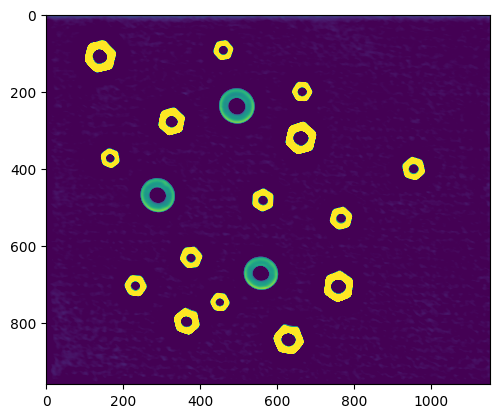

In [6]:
#@title Visualizacion de la imagen original
plt.imshow(Spz, vmin=0.0, vmax=1.0)

## 1. Preprocesamiento del recorte
----


In [7]:
#@title Seleccion del crop
#@markdown ---
x = 128 #@param {type:"integer"}
y = 334 #@param {type:"integer"}
crop_size = 80 #@param {type:"integer"}
#@markdown ---

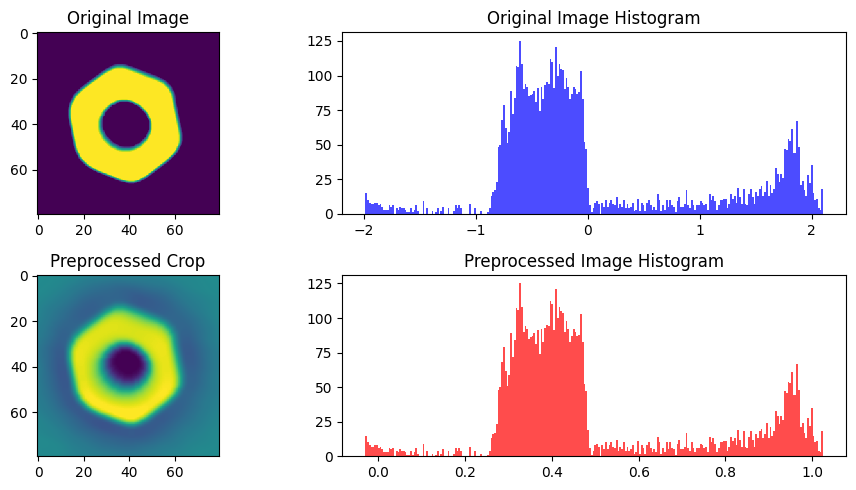

In [20]:
#@title Visualización del recorte original y preprocesado con sus histogramas
preprocessed_crop = preprocess_crop(Spz, x, y, crop_size, plot=True)

## 2. Aplicación de Transformaciones 2D
-----




In [11]:
#@title Tamaño imagen de entrenamiento [IMPORTANTE]
#@markdown ---
wide = 40 #@param {type:"integer"}
downsample = crop_size // wide
#@markdown ---

In [12]:
#@title Conjunto de transformaciones [IMPORTANTE]
#@markdown ---
min_scale = 0.8 #@param {type:"slider", min:0, max:2, step:0.1}
max_scale = 2 #@param {type:"slider", min:0, max:2, step:0.1}
translation = 1.5 #@param {type:"slider", min:0, max:2, step:0.1}
rotation = 2 #@param {type:"slider", min:0, max:2, step:0.1}
add = 0.1 #@param {type:"slider", min:0, max:2, step:0.1}
gaussian_min = 0 #@param {type:"slider", min:0, max:0.1, step:0.01}
gaussian_max = 0.01 #@param {type:"slider", min:0, max:0.1, step:0.01}
multiply_min = 0.6 #@param {type:"slider", min:0, max:2, step:0.1}
multiply_max = 1.2 #@param {type:"slider", min:0, max:2, step:0.1}
#@markdown ---

transformations = (dt.Affine(scale=lambda:np.random.uniform(min_scale, max_scale, 2), translate=lambda:np.random.uniform(-translation, translation, 2), rotate=lambda: np.random.rand()*np.pi*rotation),
                   dt.AveragePooling(ksize=(downsample, downsample, 1)),
                   dt.Add(lambda: np.random.randn() * add),
                   dt.Gaussian(sigma=lambda:np.random.uniform(gaussian_min, gaussian_max)),
                   dt.Multiply(lambda: np.random.uniform(multiply_min, multiply_max)))

<Axes: >

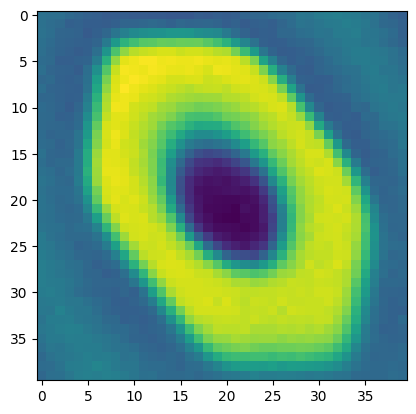

In [13]:
#@title Generacion de ejemplos con transformaciones 2D
train_set = apply_2d_transformations([preprocessed_crop], transformations)
train_set.plot()

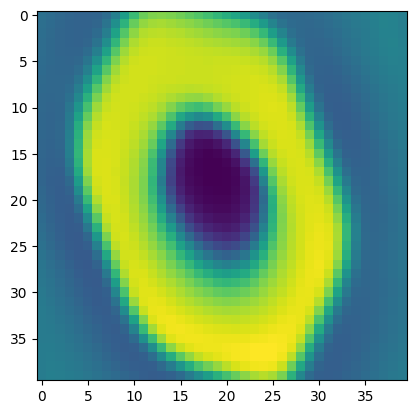

In [14]:
#@title Visualizacion de mas ejemplos
transformed_image = train_set.update()()
plt.imshow(transformed_image)

## 3. Entrenamiento del Modelo
-------------



In [15]:
#@title Entrenamiento
#@markdown ---
model = dt.models.LodeSTAR(input_shape=(None, None, 1))
TRAIN_MODE = False #@param {type:"boolean"}
weights_path = '/content/drive/MyDrive/Investigacion/Model/checkpoints/texturevs3D_3D' #@param {type:"string"}
epochs = 40 #@param {type:"integer"}
#@markdown ---

In [16]:
#@title Entrenamiento del modelo o carga de pesos (depende de TRAIN_MODE)
model = train_model(model, train_set, weights_path, train_mode=TRAIN_MODE, epochs=epochs)

## 4. Detección multi-escala de objetos
------


In [17]:
#@title Deteccion multi-escala
#@markdown ---
test_path = '/content/drive/MyDrive/Investigacion/Data/MATLAB/database/texture_vs_3D/3D/data/reconstruction16.mat' #@param {type:"string"}
key = 'Spz' #@param {type:"string"}
test_image = load_test_data(test_path, key=key)
#@markdown ---

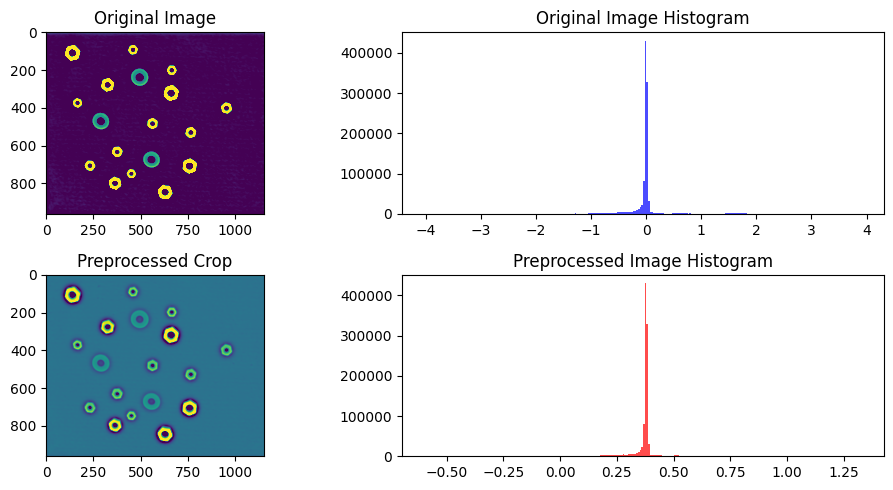

In [21]:
#@title Visualizacion de la imagen de prueba antes y despues de preprocesar
preprocessed_image, previous_image = preprocess_test_image(test_image)

In [31]:
#@title Escalas y umbral de deteccion [IMPORTANTE]
#@markdown ---
first_scale = 1 #@param {type:"number"}
second_scale = 1.5 #@param {type:"number"}
third_scale = 2 #@param {type:"number"}
scales = [first_scale, second_scale, third_scale]
cutoff = 0.9996 #@param {type:"number"}
#@markdown ---

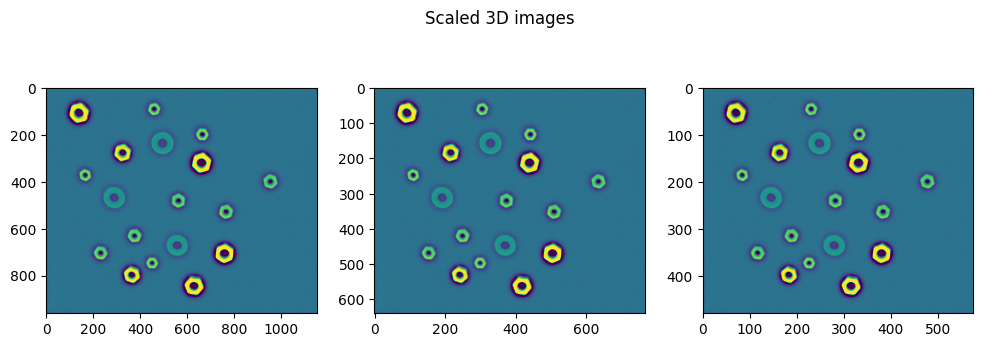

In [23]:
#@title Escalamiento de las imagenes de prueba
scaled_images = scale_test_images(preprocessed_image, scales)

1/1 [==============================] - 0s 221ms/step


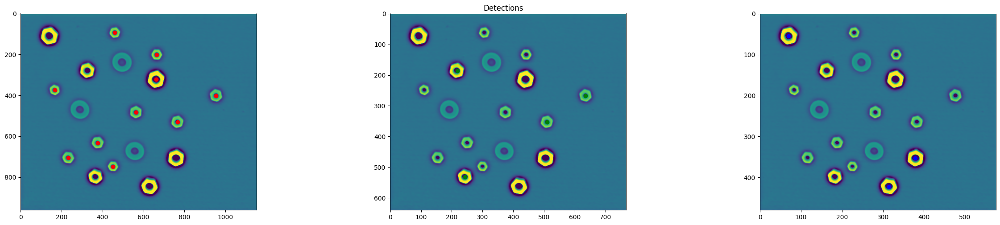

In [32]:
#@title Deteccion de objetos en cada escala
all_detections = detect_objects(scaled_images, model, cutoff=cutoff, downsample=downsample)
visualize_detections(scaled_images, all_detections)

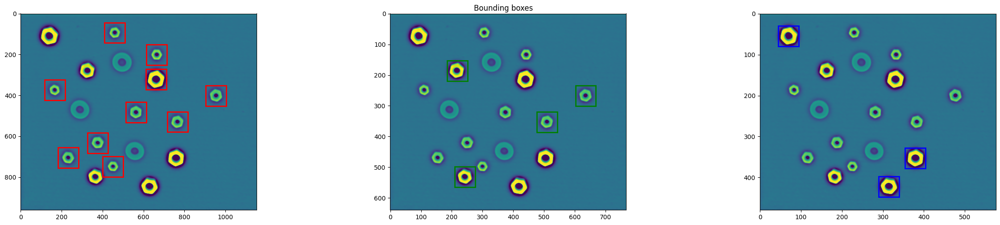

In [33]:
#@title Creacion de bounding boxes en cada escala
all_bboxes = calculate_bounding_boxes(scaled_images, all_detections, crop_size=100)
visualize_bounding_boxes(scaled_images, all_bboxes)

## 5. Supresión del No Máximo
-----


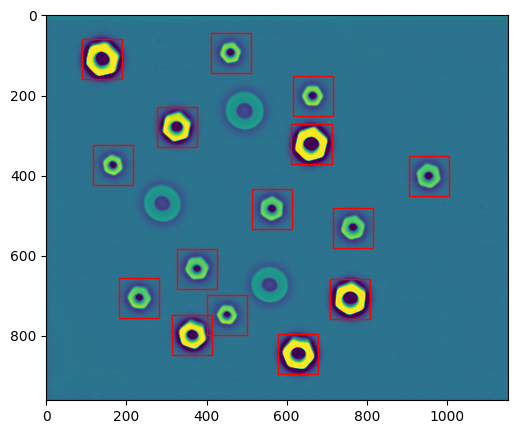

In [34]:
#@title Aplicacion de la supresion del no maximo
all_bboxes_scaled = adjust_bounding_boxes(all_bboxes, scales)
final_bboxes = apply_nms(all_bboxes_scaled, threshold=0.7)
final_image = visualize_final_bboxes(scaled_images[0], final_bboxes)

---
# Métricas - Reconstrucciones 3D
---

### Carga de imágenes

In [35]:
# @title
def load_files_from_folder(folder_path, file_type):
    # Lista para almacenar los datos cargados
    data_list = []

    # Lista de nombres de archivo ordenados alfabéticamente
    file_names = sorted(os.listdir(folder_path))

    # Recorremos todos los archivos en el directorio
    for filename in file_names:
        file_path = os.path.join(folder_path, filename)

        # Dependiendo del tipo de archivo, lo cargamos y lo agregamos a la lista
        if file_type == '.mat':
            data = scipy.io.loadmat(file_path)['Spz']
        elif file_type == '.PNG':
            data = plt.imread(file_path)
        elif file_type == '.pkl':
            with open(file_path, 'rb') as f:
                data = pickle.load(f)
        else:
            raise ValueError("Tipo de archivo no válido. Use '.mat', '.png' o '.pkl'.")

        data_list.append(data)

    return data_list

In [36]:
folder_path = '/content/drive/MyDrive/Investigacion/Data/MATLAB/database/texture_vs_3D/3D/data'
file_type = '.mat'
images_3D = load_files_from_folder(folder_path, file_type)

### Detección en todas las imágenes

In [37]:
# @title
def test(test_image, crop_size=100, scales=[1, 1.5, 2], downsample=2, cutoff=0.9995, threshold=0.7, plot_previous=False, cmap=None):
  preprocessed_image, previous_image = preprocess_test_image(test_image, plot=plot_previous)
  scaled_images = scale_test_images(preprocessed_image, scales, plot=plot_previous)

  all_detections = detect_objects(scaled_images, model, cutoff=cutoff, downsample=downsample)
  visualize_detections(scaled_images, all_detections, plot=plot_previous)

  all_bboxes = calculate_bounding_boxes(scaled_images, all_detections, crop_size=crop_size)
  visualize_bounding_boxes(scaled_images, all_bboxes, plot=plot_previous)

  all_bboxes_scaled = adjust_bounding_boxes(all_bboxes, scales)
  final_bboxes = apply_nms(all_bboxes_scaled, threshold=threshold)
  final_image = visualize_final_bboxes(scaled_images[0], final_bboxes, cmap=cmap)

  return final_bboxes

In [39]:
# @title
# Función para invertir las coordenadas x e y en un bounding box
def invert_coordinates(bbox):
    return [bbox[1], bbox[0], bbox[3], bbox[2]]

1/1 [==============================] - 0s 289ms/step


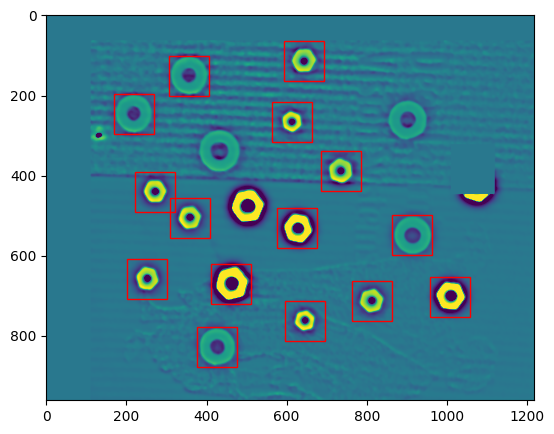

1/1 [==============================] - 0s 248ms/step


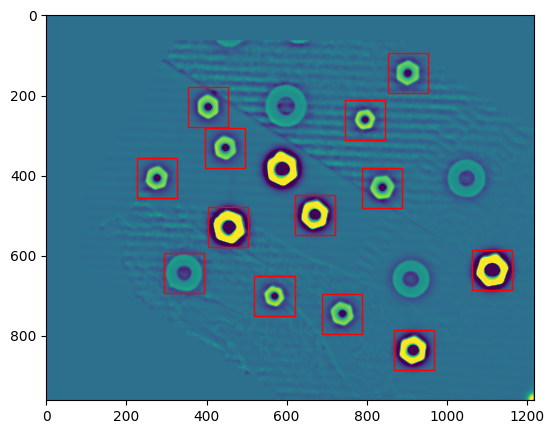

1/1 [==============================] - 0s 419ms/step


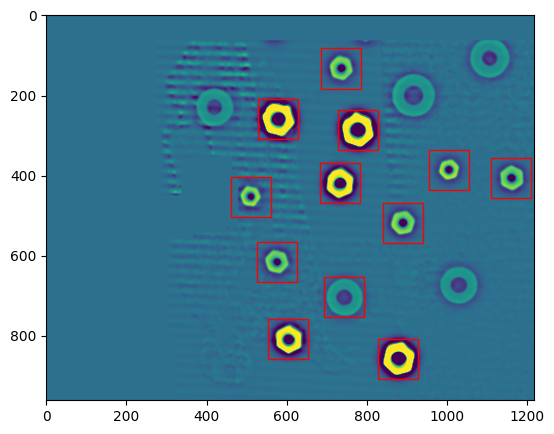

1/1 [==============================] - 0s 242ms/step


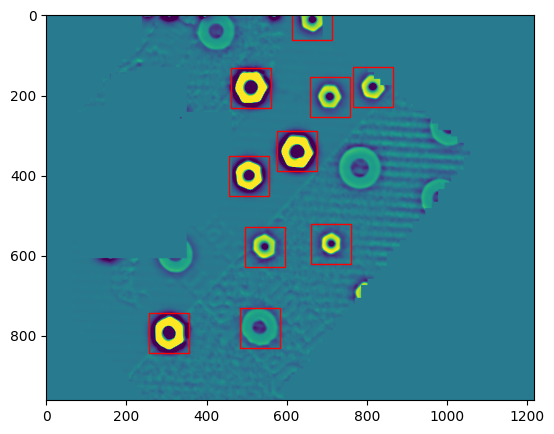

1/1 [==============================] - 0s 220ms/step


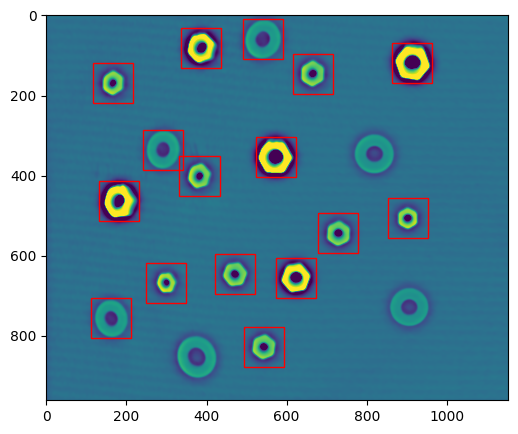

1/1 [==============================] - 0s 176ms/step


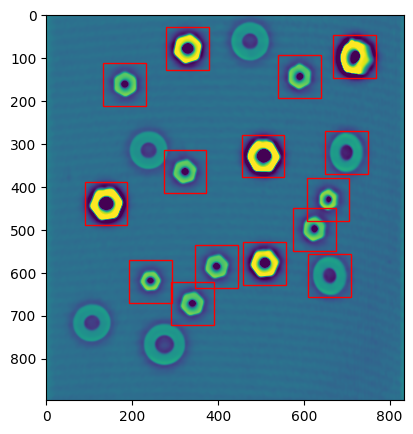

1/1 [==============================] - 0s 227ms/step


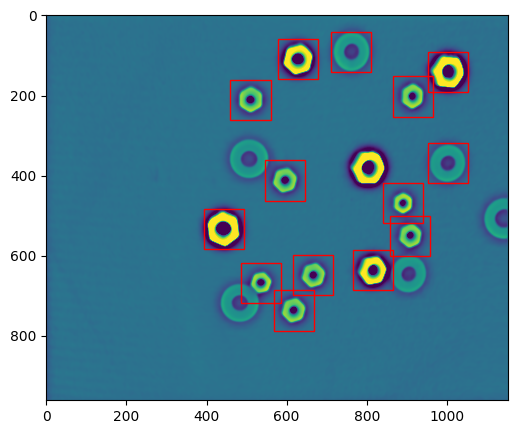

1/1 [==============================] - 0s 443ms/step


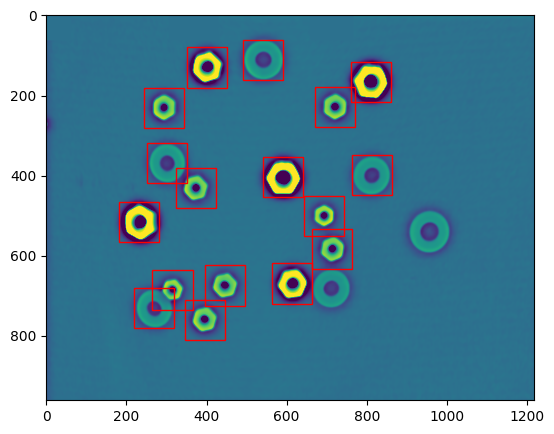

1/1 [==============================] - 0s 251ms/step


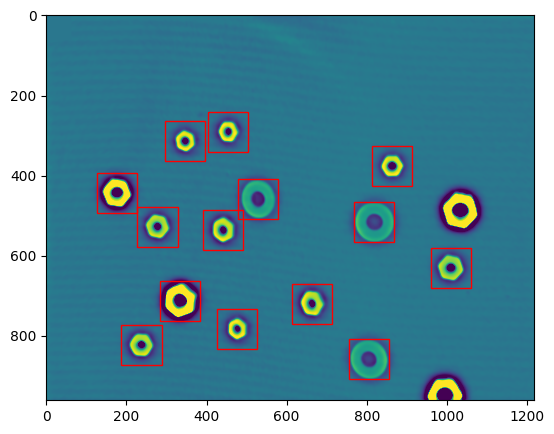

1/1 [==============================] - 0s 233ms/step


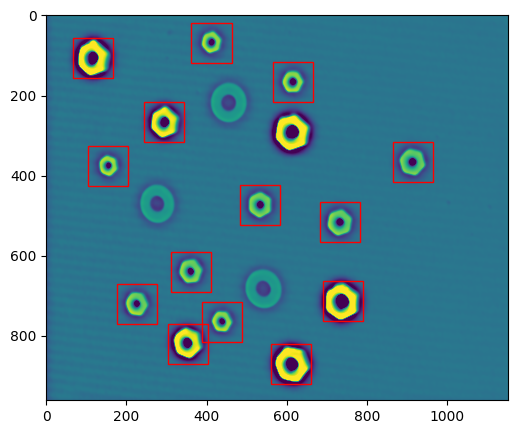

1/1 [==============================] - 0s 175ms/step


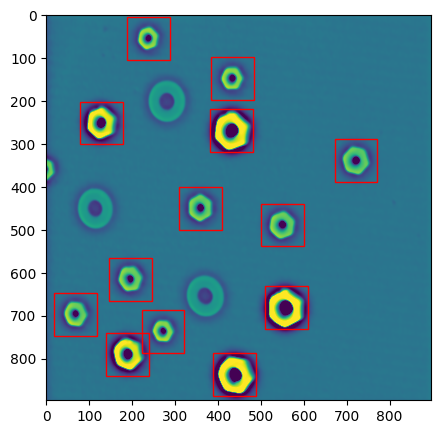

1/1 [==============================] - 0s 182ms/step


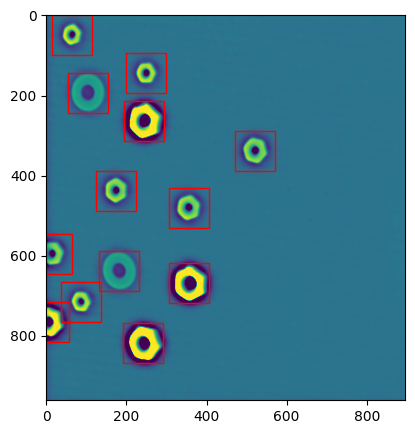

1/1 [==============================] - 0s 217ms/step


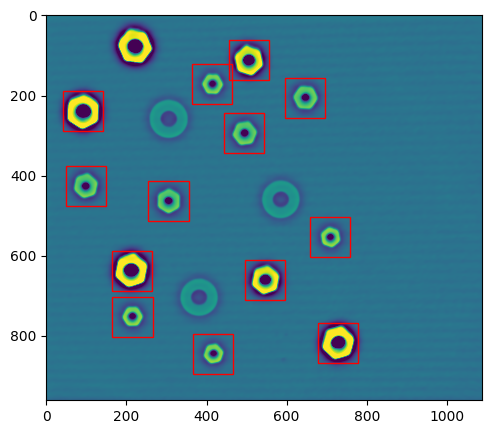

1/1 [==============================] - 0s 404ms/step


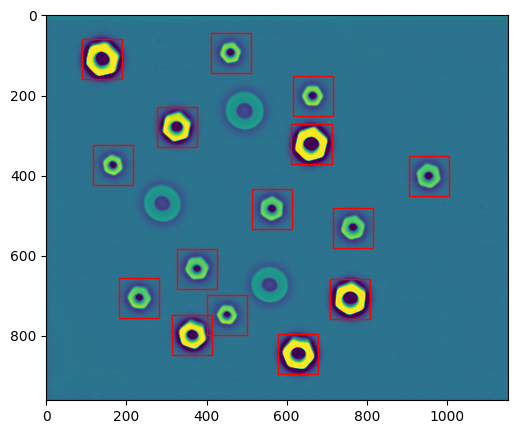

1/1 [==============================] - 0s 248ms/step


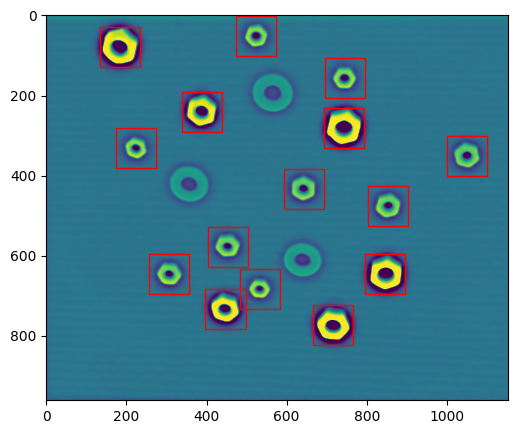

1/1 [==============================] - 0s 232ms/step


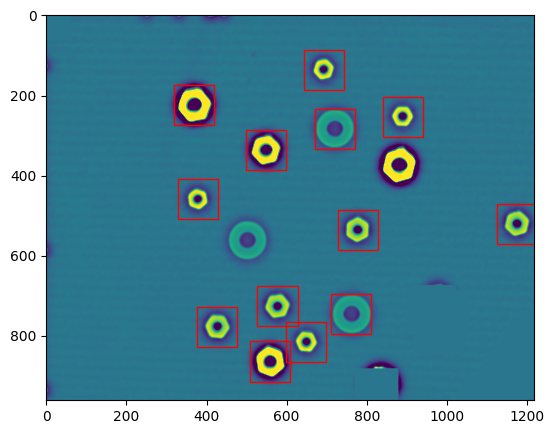

1/1 [==============================] - 0s 240ms/step


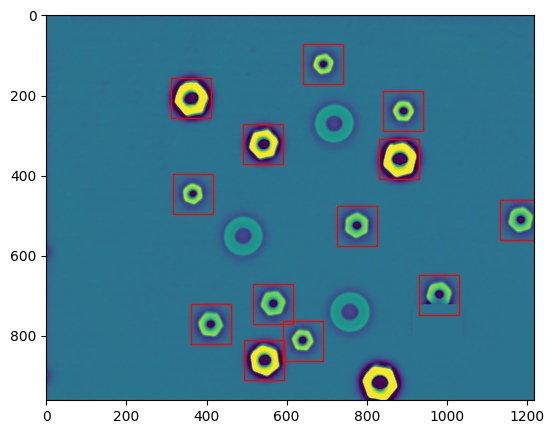

1/1 [==============================] - 0s 224ms/step


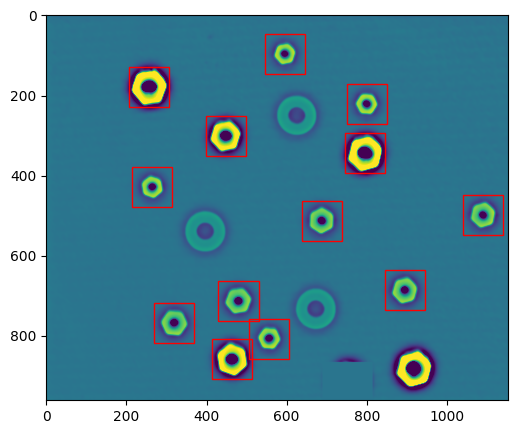

1/1 [==============================] - 0s 415ms/step


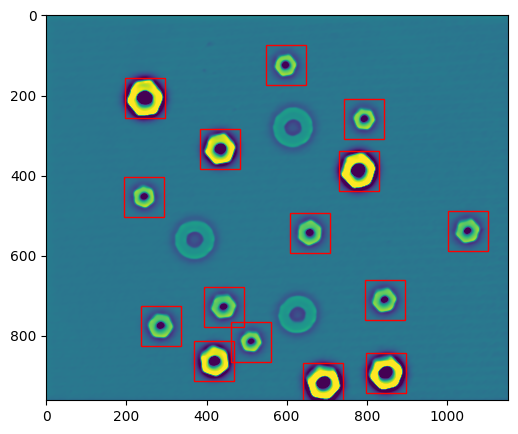

1/1 [==============================] - 0s 234ms/step


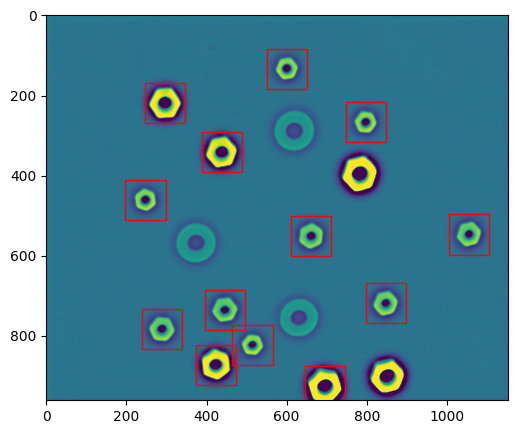

In [72]:
# @title
predictions_images_3D = []

for idx in range(len(images_3D)):
    detected_boxes_3D = test(images_3D[idx], crop_size=100, scales=[1, 1.5, 2], downsample=2, cutoff=0.9996, threshold=0.7, plot_previous=False)
    # Invertir las coordenadas x e y en las predicciones
    inverted_boxes_3D = [invert_coordinates(bbox) for bbox in detected_boxes_3D]

    predictions_images_3D.append(inverted_boxes_3D)

### Carga de ground truth

In [44]:
folder_path = '/content/drive/MyDrive/Investigacion/Data/MATLAB/database/texture_vs_3D/3D/ground_truth'
file_type = '.pkl'
ground_truth_3D = load_files_from_folder(folder_path, file_type)

### Comparación de resultados

In [45]:
# @title
def calculate_iou(gt_box, pred_box):
    """
    Calcula el IoU (Intersection over Union) entre dos bounding boxes en formato [xmin, ymin, xmax, ymax].
    """
    # Calcula la intersección entre los bounding boxes
    x1 = np.maximum(gt_box[0], pred_box[0])
    y1 = np.maximum(gt_box[1], pred_box[1])
    x2 = np.minimum(gt_box[2], pred_box[2])
    y2 = np.minimum(gt_box[3], pred_box[3])
    intersection = np.maximum(0, x2 - x1) * np.maximum(0, y2 - y1)

    # Calcula la unión entre los bounding boxes
    gt_area = (gt_box[2] - gt_box[0]) * (gt_box[3] - gt_box[1])
    pred_area = (pred_box[2] - pred_box[0]) * (pred_box[3] - pred_box[1])
    union = gt_area + pred_area - intersection

    # Calcula el IoU
    iou = intersection / union

    return iou

def confusion_matrix(tp, fp, fn):
    """
    Construye una matriz de confusión a partir de los valores de verdaderos positivos (tp), falsos positivos (fp)
    y falsos negativos (fn).
    """
    tn = 0  # asumimos que no hay verdaderos negativos en este caso

    return np.array([[tp, fp], [fn, tn]])

def plot_confusion_matrix(conf_matrix):
    """
    Muestra la matriz de confusión como una gráfica utilizando la biblioteca matplotlib.
    """
    fig, ax = plt.subplots(figsize=(6,4))
    im = ax.imshow(conf_matrix, cmap='Blues')

    for i in range(conf_matrix.shape[0]):
        for j in range(conf_matrix.shape[1]):
            ax.text(j, i, str(conf_matrix[i][j]), ha='center', va='center')

    plt.colorbar(im)
    plt.xticks([0, 1], ['Positive', 'Negative'])
    plt.yticks([0, 1], ['Positive', 'Negative'])
    plt.xlabel('Actual values')
    plt.ylabel('Predicted values')
    plt.title('Confusion Matrix')
    plt.show()

def calculate_metrics(gt_boxes, pred_boxes, iou_threshold=0.5):
    """
    Calcula la precisión, el recall, el puntaje F1 y el accuracy para un conjunto de bounding boxes del ground truth
    y los predichos por una CNN.
    gt_boxes y pred_boxes deben ser NumPy arrays de bounding boxes en el formato [[xmin, ymin, xmax, ymax], ...].
    iou_threshold es el umbral de IoU para considerar que un bounding box predicho es correcto.
    """
    tp = 0
    fp = 0
    fn = 0

    for gt_box in gt_boxes:
        gt_matched = False
        for pred_box in pred_boxes:
            iou = calculate_iou(gt_box, pred_box)
            if iou >= iou_threshold:
                tp += 1
                gt_matched = True
                break
        if not gt_matched:
            fn += 1

    for pred_box in pred_boxes:
        pred_matched = False
        for gt_box in gt_boxes:
            iou = calculate_iou(gt_box, pred_box)
            if iou >= iou_threshold:
                pred_matched = True
                break
        if not pred_matched:
            fp += 1

    if tp == 0 and fp == 0 and fn == 0:
        # En caso de que no haya objetos en el ground truth o en las predicciones, todas las métricas son cero.
        precision = 0.0
        recall = 0.0
        f1_score = 0.0
        accuracy = 0.0
    else:
        precision = round(tp / float(tp + fp), 3)
        recall = round(tp / float(tp + fn), 3)
        if precision == 0 and recall == 0:
            f1_score = 0.0
        else:
            f1_score = round(2 * ((precision * recall) / (precision + recall)), 3)
        accuracy = round(tp / float(tp + fp + fn), 3)

    return precision, recall, f1_score, accuracy

def generate_metrics(gt_boxes, pred_boxes, iou_threshold=0.5):
    tp = 0
    fp = 0
    fn = 0
    total_tp = 0
    total_fp = 0
    total_fn = 0

    for gt_box in gt_boxes:
        gt_matched = False
        for pred_box in pred_boxes:
            iou = calculate_iou(gt_box, pred_box)
            if iou >= iou_threshold:
                tp += 1
                gt_matched = True
                break
        if not gt_matched:
            fn += 1

    total_tp += tp
    total_fn += fn

    for pred_box in pred_boxes:
        pred_matched = False
        for gt_box in gt_boxes:
            iou = calculate_iou(gt_box, pred_box)
            if iou >= iou_threshold:
                pred_matched = True
                break
        if not pred_matched:
            fp += 1

    total_fp += fp

    precision, recall, f1_score, accuracy = calculate_metrics(gt_boxes, pred_boxes, iou_threshold)
    conf_matrix = confusion_matrix(tp, fp, fn)

    return precision, recall, f1_score, accuracy, conf_matrix, [total_fp, total_fn, total_tp]

In [99]:
# @title
import statistics
from matplotlib.patches import Rectangle

def evaluate_predictions(all_images, all_gt_boxes, all_detected_boxes, cmap=None, gt_color='black'):
    # General metrics
    prom_metrics = {"prom_precision": [], "prom_accuracy": [], "prom_recall": [], "prom_f1_score": []}

    for image, gt_boxes, detected_boxes in zip(all_images, all_gt_boxes, all_detected_boxes):
        # Create a copy of the image to avoid modifying the original
        image_copy = image.copy()

        fig, ax = plt.subplots()
        ax.imshow(image_copy, cmap=cmap)

        # Ground truth bounding boxes (green)
        for gt_box in gt_boxes:
            x1, y1, x2, y2 = gt_box
            rect = Rectangle((x1, y1), x2 - x1, y2 - y1, linewidth=3, edgecolor=gt_color, facecolor='none')
            ax.add_patch(rect)

        # Predicted bounding boxes (red)
        for detected_box in detected_boxes:
            x1, y1, x2, y2 = detected_box
            rect = Rectangle((x1, y1), x2 - x1, y2 - y1, linewidth=1, edgecolor='r', facecolor='none')
            ax.add_patch(rect)

        plt.show()

        # Individual metrics
        precision, recall, f1_score, accuracy, conf_matrix, [fp, fn, tp] = generate_metrics(gt_boxes, detected_boxes)
        prom_metrics["prom_precision"].append(precision)
        prom_metrics["prom_recall"].append(recall)
        prom_metrics["prom_f1_score"].append(f1_score)
        prom_metrics["prom_accuracy"].append(accuracy)

        print(f'Precision: {precision}')
        print(f'Accuracy: {accuracy}')
        print(f'Recall: {recall}')
        print(f'F1 Score: {f1_score}')

        # Confusion Matrix
        plot_confusion_matrix(conf_matrix)

    # Average results and standard deviation
    print("-----Average results-----\n")
    for metric in prom_metrics:
        avg_metric = sum(prom_metrics[metric]) / len(prom_metrics[metric])
        std_dev = statistics.stdev(prom_metrics[metric])
        print(f'Average {metric}: {round(avg_metric, 3)} +/- {round(std_dev, 3)}')

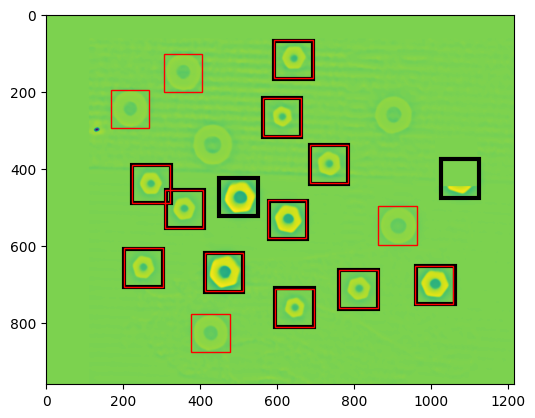

Precision: 0.733
Accuracy: 0.647
Recall: 0.846
F1 Score: 0.785


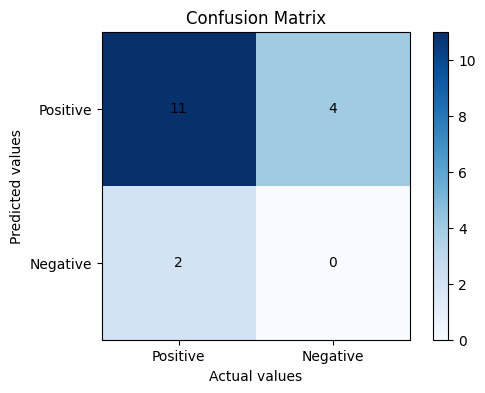

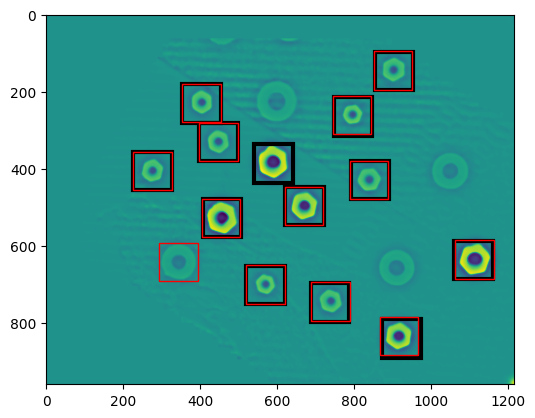

Precision: 0.923
Accuracy: 0.857
Recall: 0.923
F1 Score: 0.923


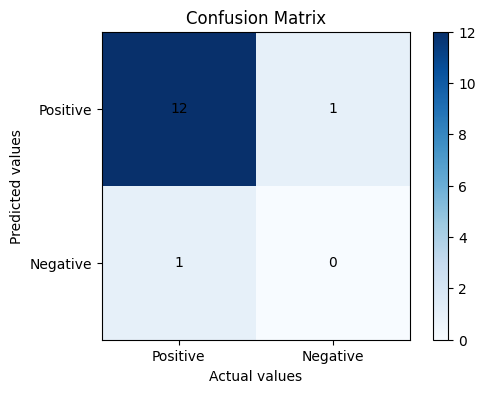

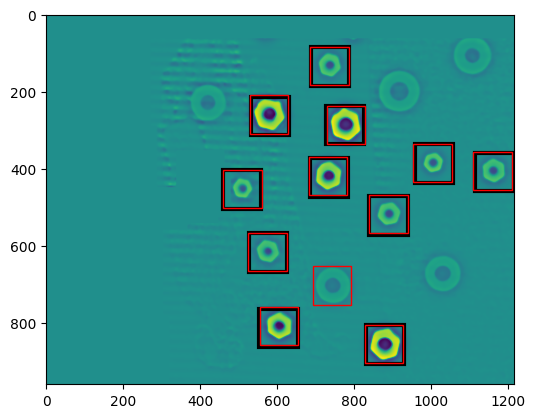

Precision: 0.917
Accuracy: 0.917
Recall: 1.0
F1 Score: 0.957


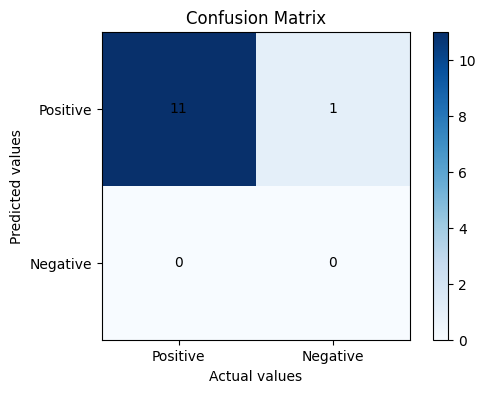

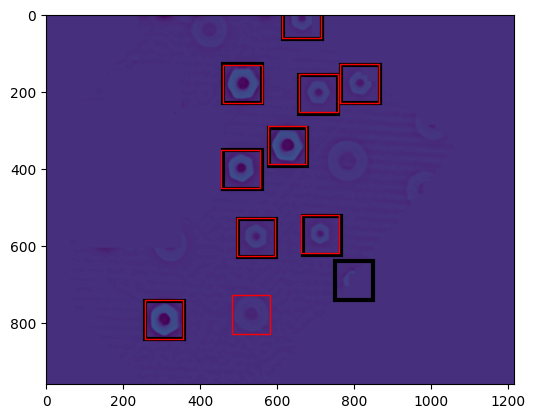

Precision: 0.9
Accuracy: 0.818
Recall: 0.9
F1 Score: 0.9


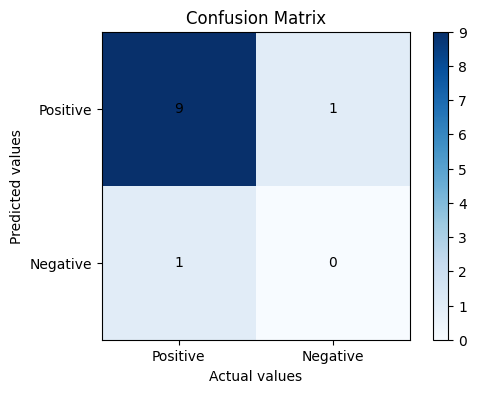

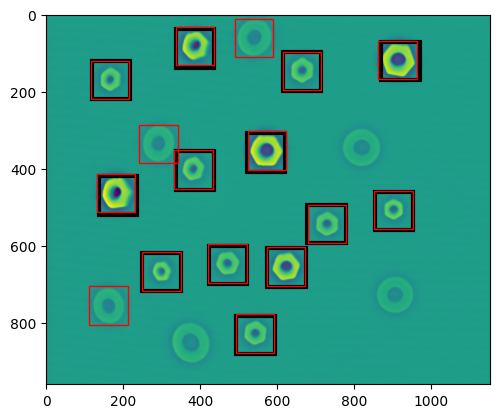

Precision: 0.812
Accuracy: 0.812
Recall: 1.0
F1 Score: 0.896


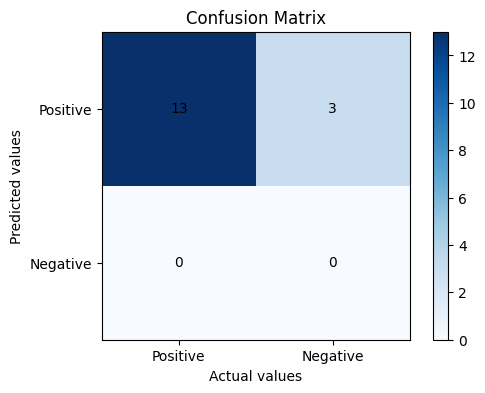

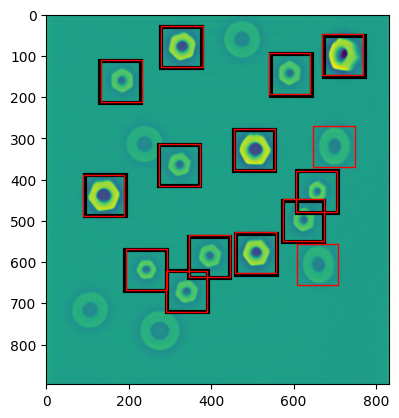

Precision: 0.867
Accuracy: 0.867
Recall: 1.0
F1 Score: 0.929


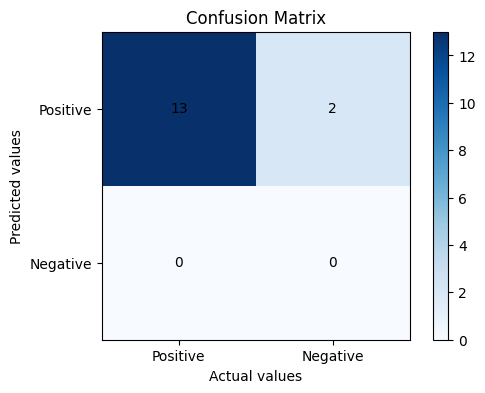

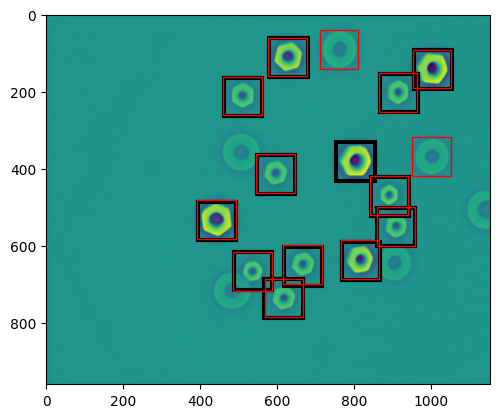

Precision: 0.857
Accuracy: 0.8
Recall: 0.923
F1 Score: 0.889


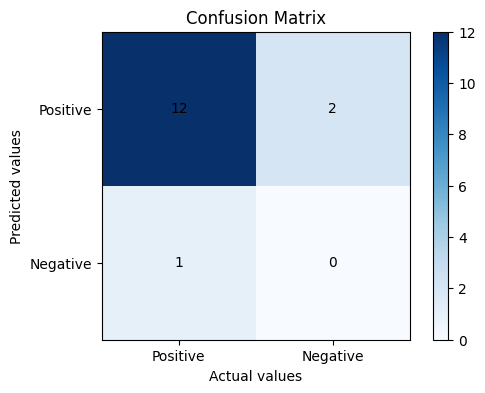

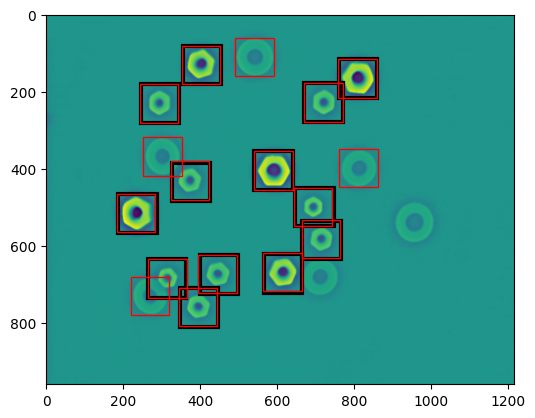

Precision: 0.765
Accuracy: 0.765
Recall: 1.0
F1 Score: 0.867


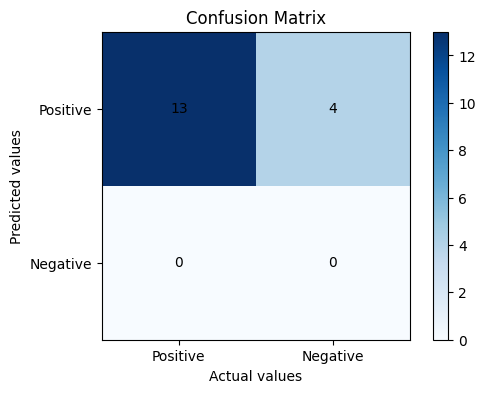

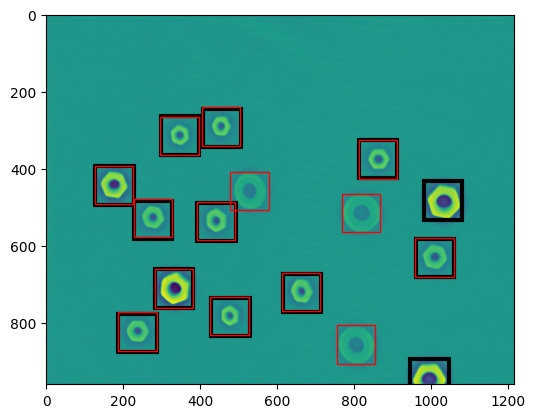

Precision: 0.786
Accuracy: 0.688
Recall: 0.846
F1 Score: 0.815


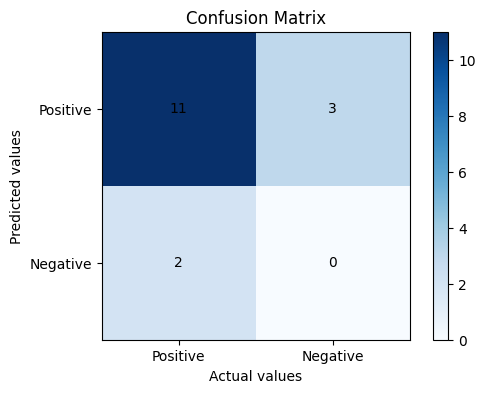

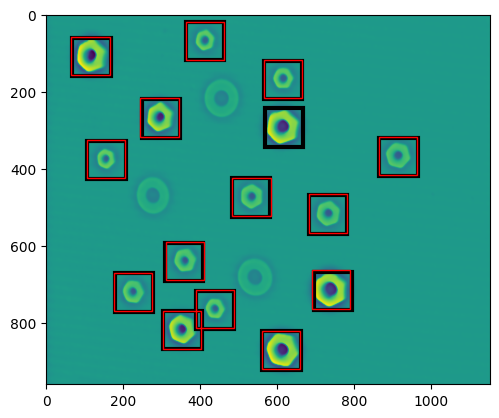

Precision: 1.0
Accuracy: 0.933
Recall: 0.933
F1 Score: 0.965


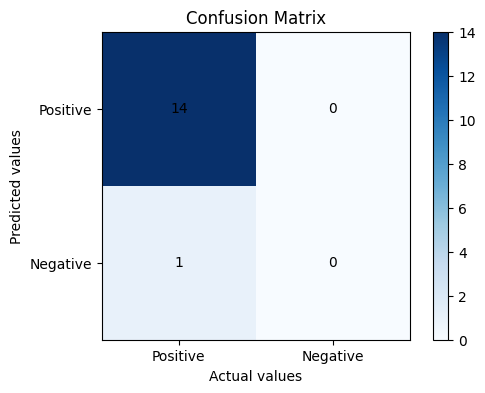

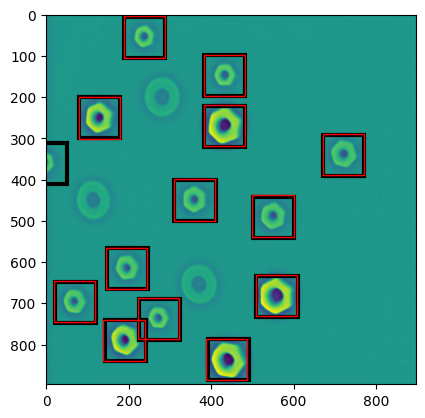

Precision: 1.0
Accuracy: 0.929
Recall: 0.929
F1 Score: 0.963


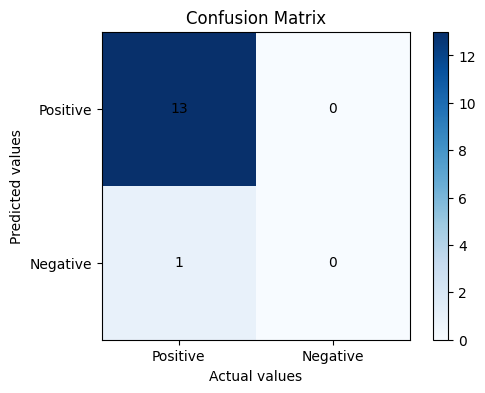

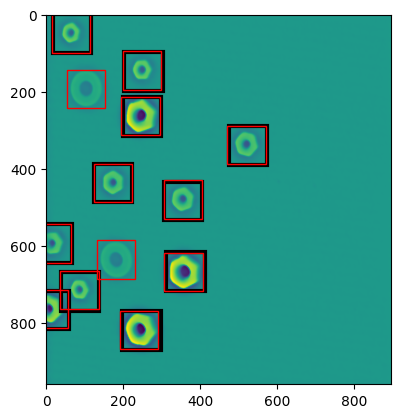

Precision: 0.846
Accuracy: 0.846
Recall: 1.0
F1 Score: 0.917


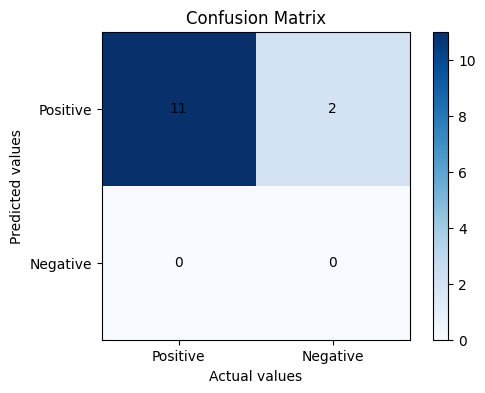

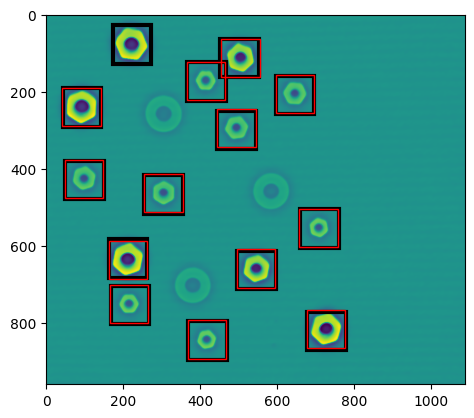

Precision: 1.0
Accuracy: 0.929
Recall: 0.929
F1 Score: 0.963


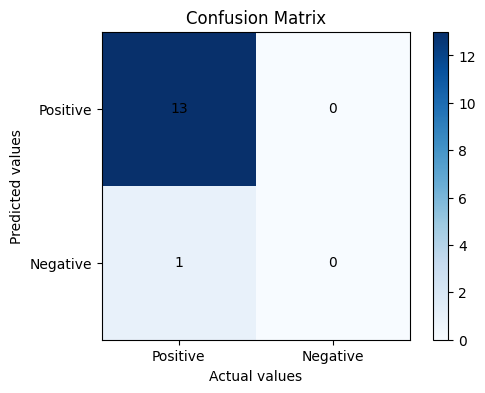

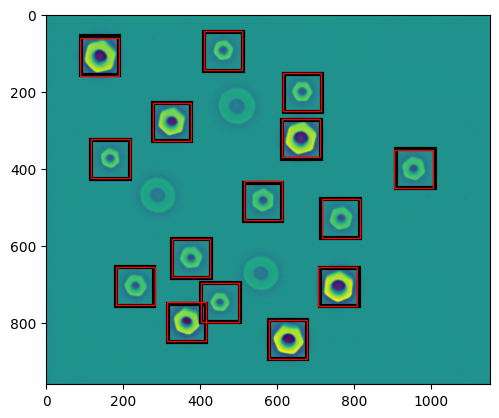

Precision: 1.0
Accuracy: 1.0
Recall: 1.0
F1 Score: 1.0


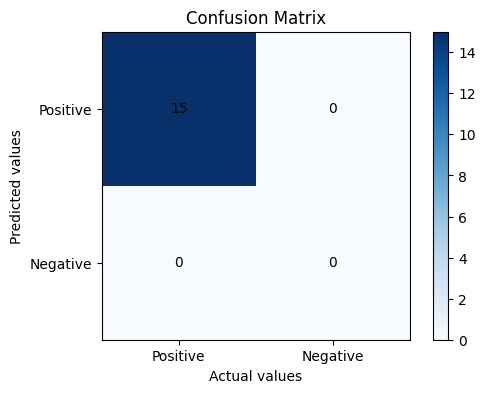

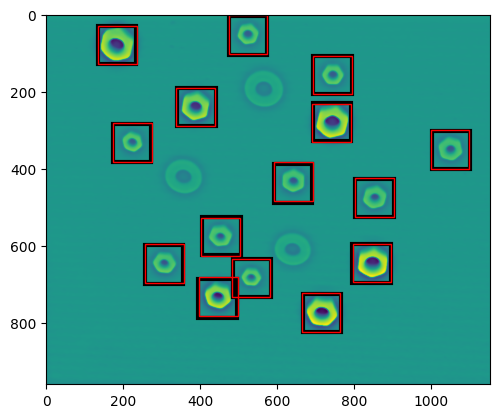

Precision: 1.0
Accuracy: 1.0
Recall: 1.0
F1 Score: 1.0


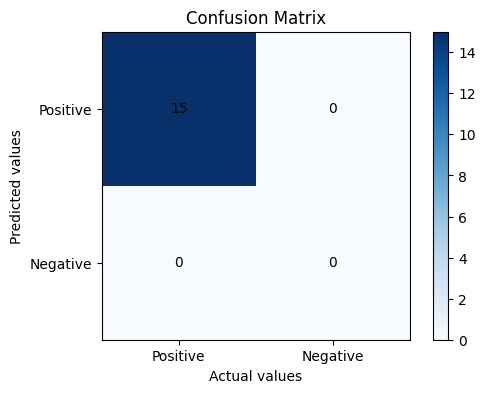

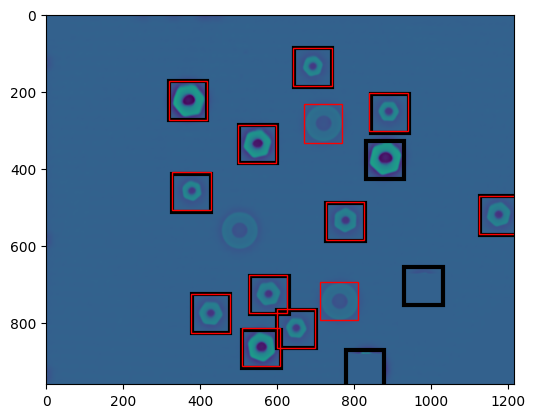

Precision: 0.846
Accuracy: 0.688
Recall: 0.786
F1 Score: 0.815


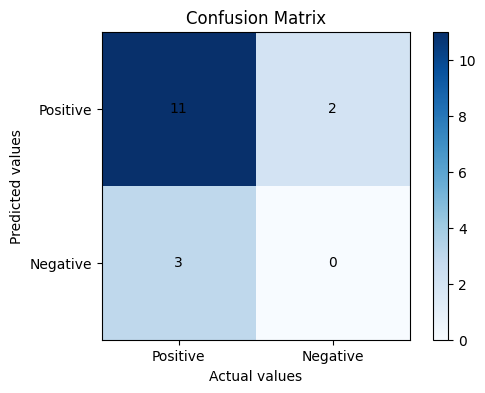

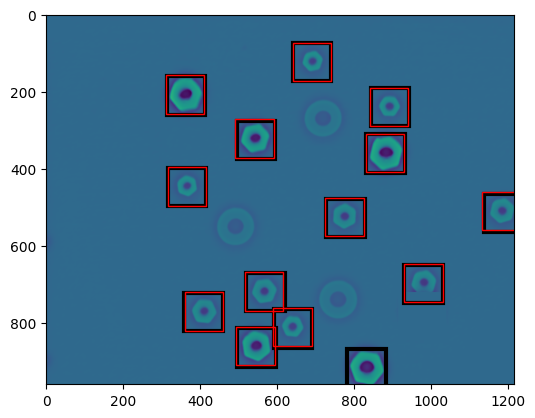

Precision: 1.0
Accuracy: 0.929
Recall: 0.929
F1 Score: 0.963


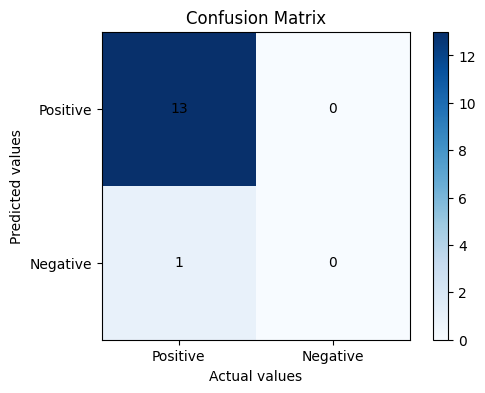

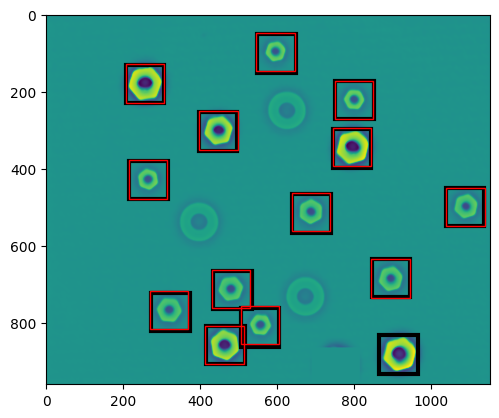

Precision: 1.0
Accuracy: 0.929
Recall: 0.929
F1 Score: 0.963


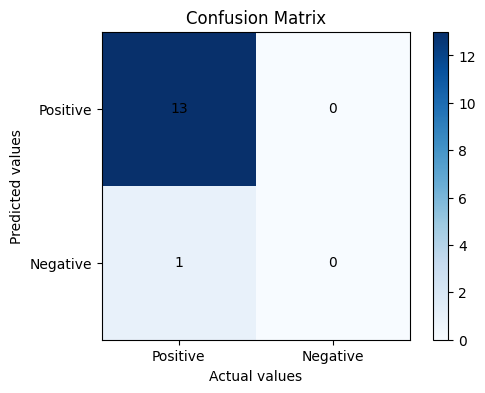

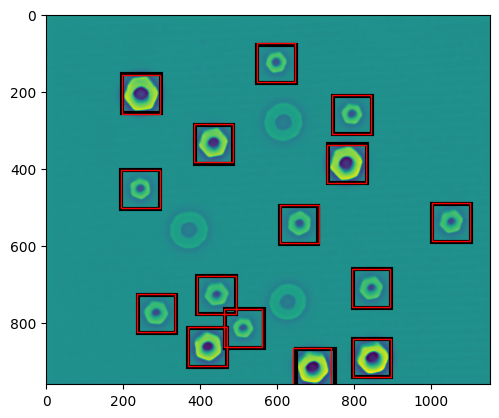

Precision: 1.0
Accuracy: 1.0
Recall: 1.0
F1 Score: 1.0


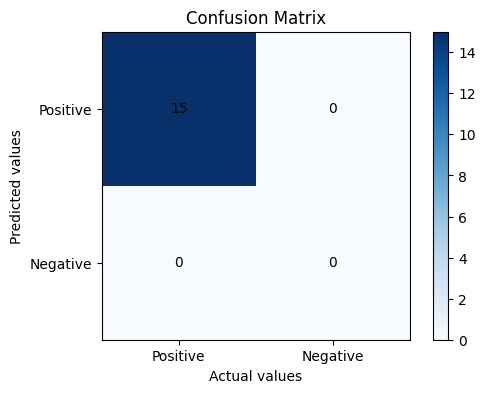

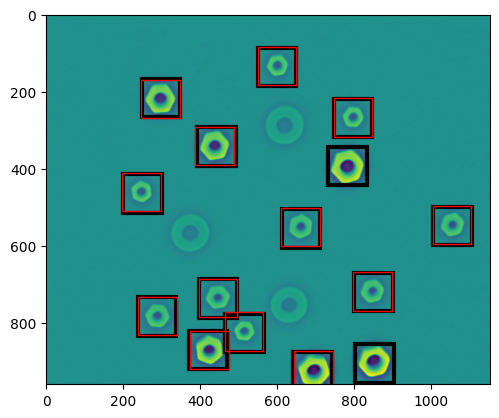

Precision: 1.0
Accuracy: 0.867
Recall: 0.867
F1 Score: 0.929


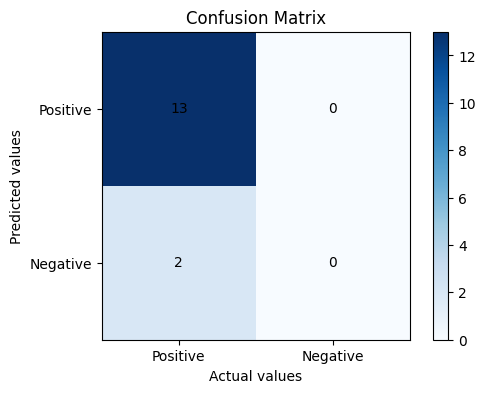

-----Average results-----

Average prom_precision: 0.913 +/- 0.093
Average prom_accuracy: 0.861 +/- 0.105
Average prom_recall: 0.937 +/- 0.064
Average prom_f1_score: 0.922 +/- 0.063


In [103]:
# Black - Ground truth
# Red - Predictions
evaluate_predictions(images_3D, ground_truth_3D, predictions_images_3D, gt_color='black')

---
# 2. Imagen de textura
---

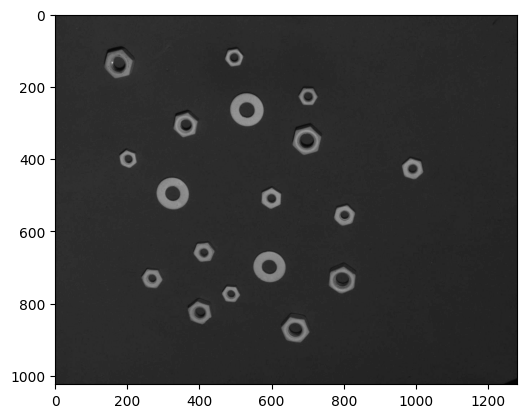

In [75]:
#@title Carga de informacion
#@markdown ---
train_path2 = '/content/drive/MyDrive/Investigacion/Data/MATLAB/database/texture_vs_3D/texture/data/pose_16.PNG' #@param{type:"string"}
train_image2 = plt.imread(train_path2)
plt.imshow(train_image2, cmap='gray')


In [76]:
#@title Seleccion del crop
#@markdown ---
x2 = 160 #@param {type:"integer"}
y2 = 360 #@param {type:"integer"}
crop_size = 80 #@param {type:"integer"}
#@markdown ---

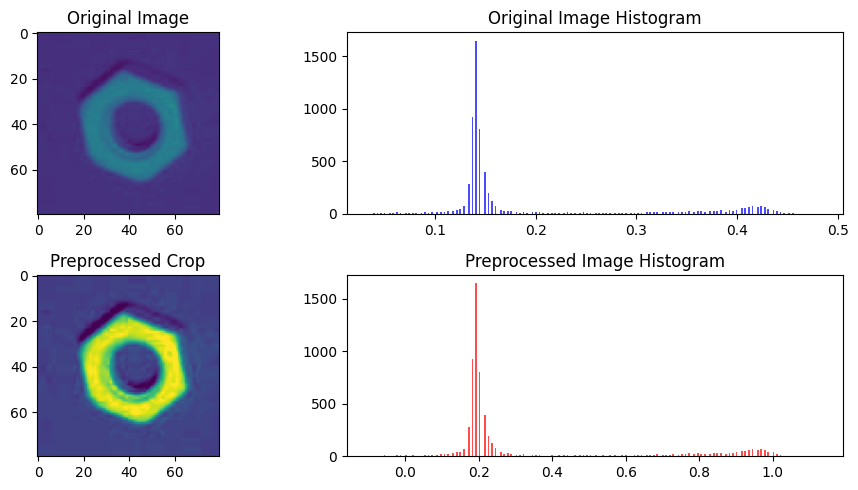

In [77]:
#@title Visualización del recorte original y preprocesado con sus histogramas
preprocessed_crop2 = preprocess_crop(train_image2, x2, y2, crop_size, plot=True)

In [78]:
#@title Tamaño imagen de entrenamiento [IMPORTANTE]
#@markdown ---
wide = 40 #@param {type:"integer"}
downsample = crop_size // wide
#@markdown ---

<Axes: >

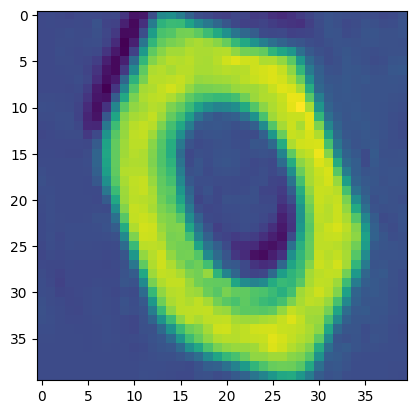

In [79]:
#@title Generacion de ejemplos con transformaciones 2D
train_set2 = apply_2d_transformations([preprocessed_crop2], transformations)
train_set2.plot()

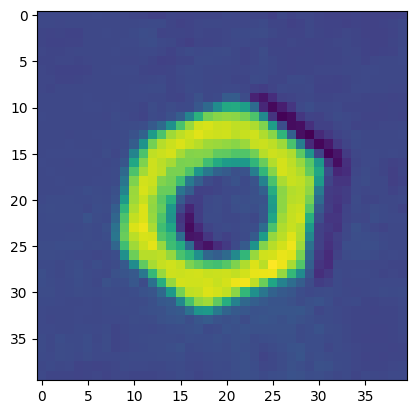

In [80]:
#@title Visualizacion de mas ejemplos
transformed_image2 = train_set2.update()()
plt.imshow(transformed_image2)

In [81]:
#@title Entrenamiento
#@markdown ---
model2 = dt.models.LodeSTAR(input_shape=(None, None, 1))
TRAIN_MODE = False #@param {type:"boolean"}
weights_path2 = '/content/drive/MyDrive/Investigacion/Model/checkpoints/texturevs3D_texture' #@param {type:"string"}
epochs = 40 #@param {type:"integer"}
#@markdown ---

In [82]:
#@title Entrenamiento del modelo o carga de pesos (depende de TRAIN_MODE)
model = train_model(model2, train_set2, weights_path2, train_mode=TRAIN_MODE, epochs=epochs)

In [83]:
#@title Deteccion multi-escala
#@markdown ---
test_path2 = '/content/drive/MyDrive/Investigacion/Data/MATLAB/database/texture_vs_3D/texture/data/pose_16.PNG' #@param{type:"string"}
test_image2 = plt.imread(test_path2)
#@markdown ---

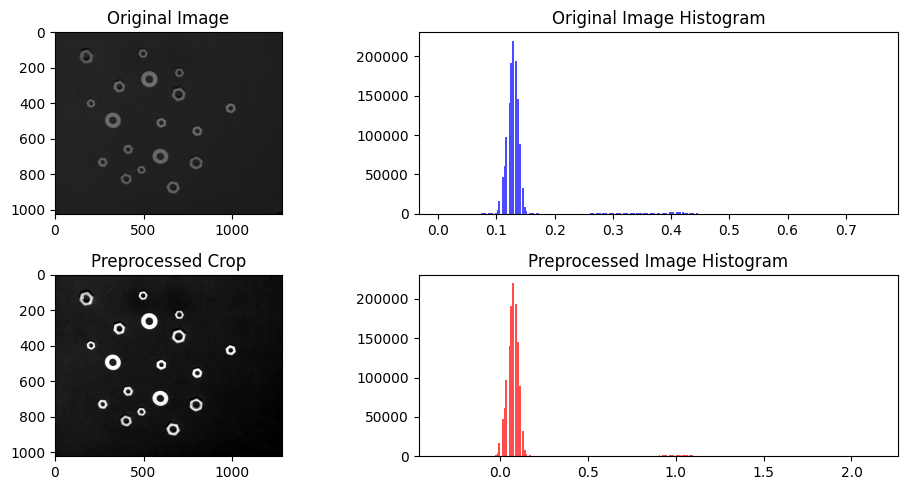

In [84]:
#@title Visualizacion de la imagen de prueba antes y despues de preprocesar
previous_test_image2 = np.copy(test_image2)
test_image2 = normalize_images(test_image2)
visualize_histograms(previous_test_image2, test_image2, cmap='gray')

In [85]:
#@title Escalas y umbral de deteccion [IMPORTANTE]
#@markdown ---
first_scale2 = 1 #@param {type:"number"}
second_scale2 = 1.25 #@param {type:"number"}
third_scale2 = 1.5 #@param {type:"number"}
scales2 = [first_scale2, second_scale2, third_scale2]
cutoff2 = 0.9995 #@param {type:"number"}
#@markdown ---

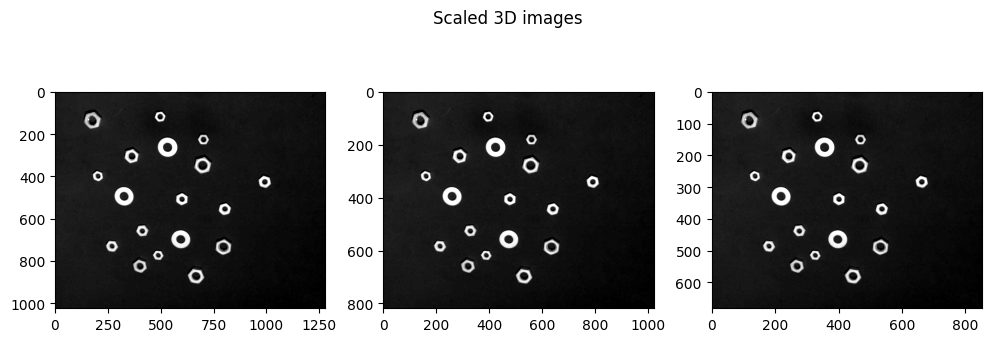

In [86]:
#@title Escalamiento de las imagenes de prueba
scaled_images2 = scale_test_images(test_image2, scales2, cmap='gray')

1/1 [==============================] - 0s 469ms/step


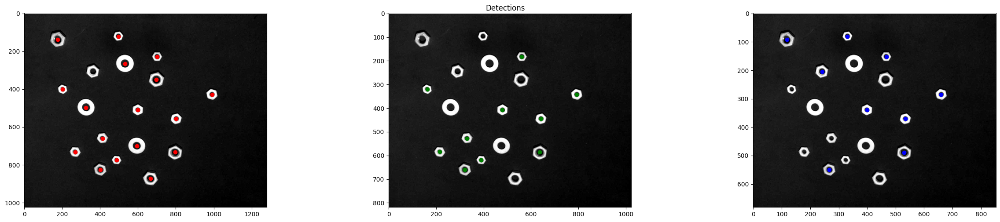

In [88]:
#@title Deteccion de objetos en cada escala
all_detections2 = detect_objects(scaled_images2, model2, cutoff=cutoff2, downsample=downsample)
visualize_detections(scaled_images2, all_detections2, cmap='gray')

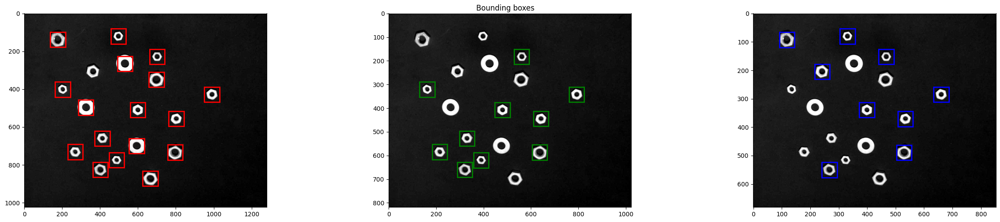

In [89]:
#@title Creacion de bounding boxes en cada escala
all_bboxes2 = calculate_bounding_boxes(scaled_images2, all_detections2, crop_size)
visualize_bounding_boxes(scaled_images2, all_bboxes2, cmap='gray')

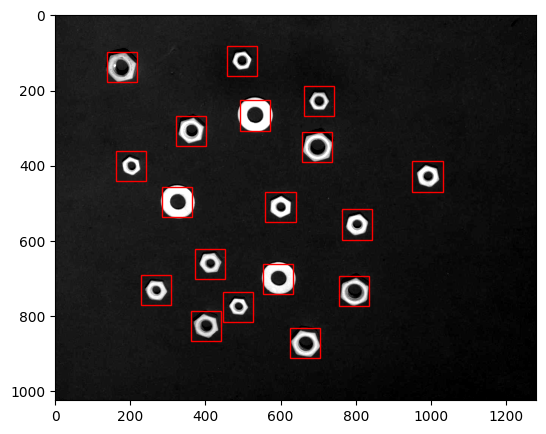

In [90]:
#@title Aplicacion de la supresion del no maximo
all_bboxes_scaled2 = adjust_bounding_boxes(all_bboxes2, scales2)
final_bboxes2 = apply_nms(all_bboxes_scaled2, threshold=0.6)
final_image2 = visualize_final_bboxes(scaled_images2[0], final_bboxes2, cmap='gray')

# Métricas - Imágenes de Textura
---

### Carga de imágenes

In [91]:
folder_path = '/content/drive/MyDrive/Investigacion/Data/MATLAB/database/texture_vs_3D/texture/data'
file_type = '.PNG'
images_texture = load_files_from_folder(folder_path, file_type)

### Detección en todas las imágenes

1/1 [==============================] - 1s 612ms/step


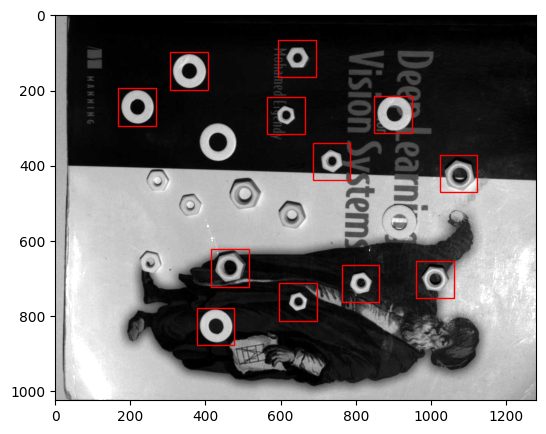

1/1 [==============================] - 0s 468ms/step


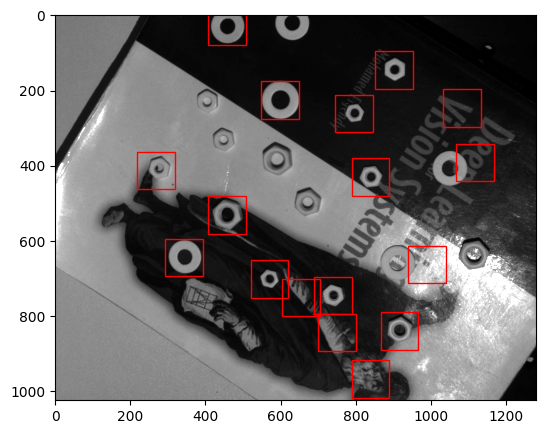

1/1 [==============================] - 1s 821ms/step


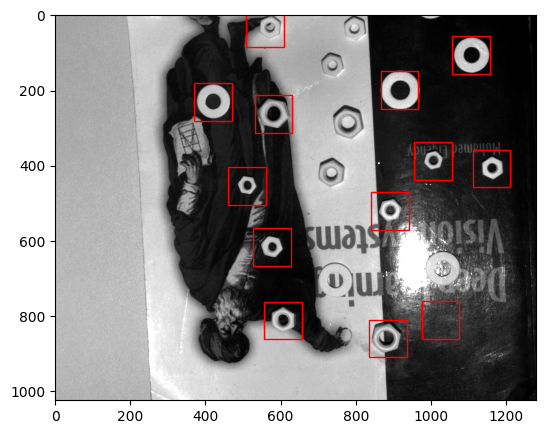

1/1 [==============================] - 0s 448ms/step


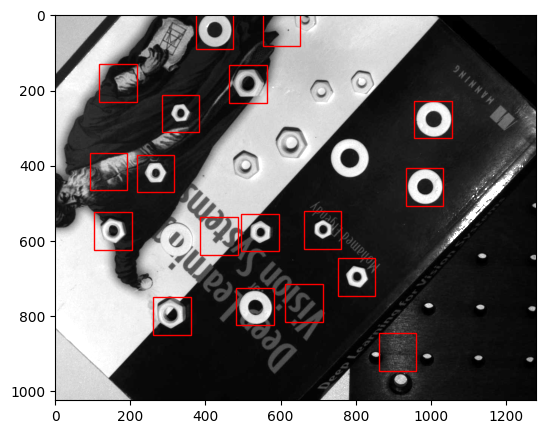

1/1 [==============================] - 0s 431ms/step


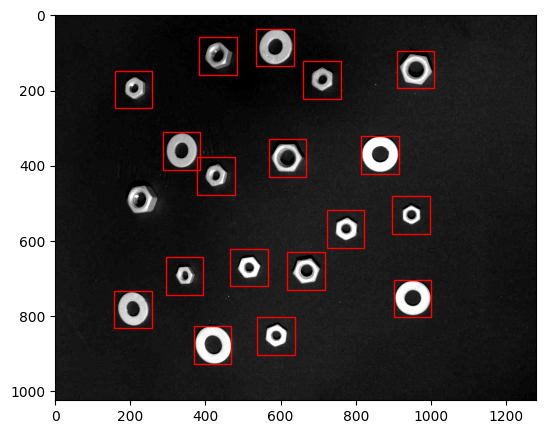

1/1 [==============================] - 0s 477ms/step


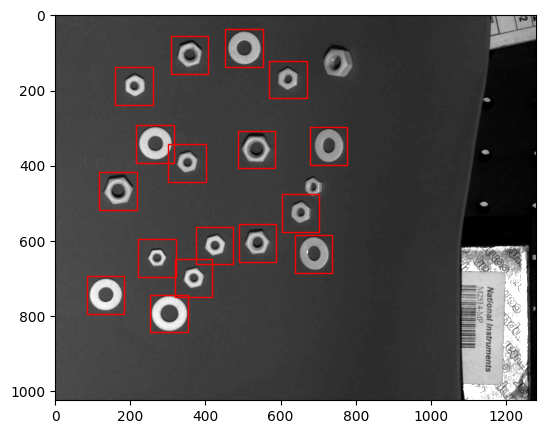

1/1 [==============================] - 1s 832ms/step


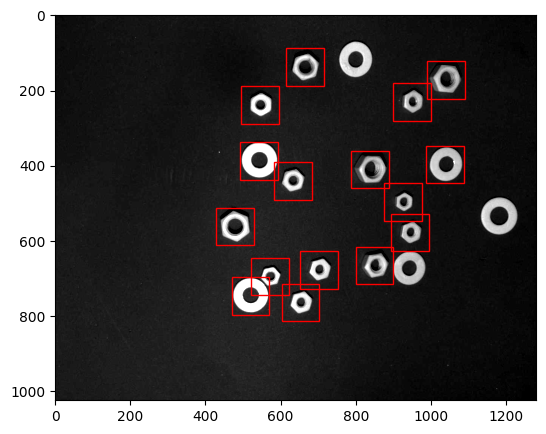

1/1 [==============================] - 0s 451ms/step


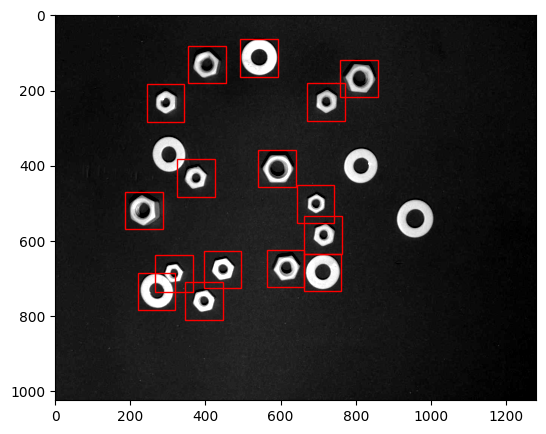

1/1 [==============================] - 0s 460ms/step


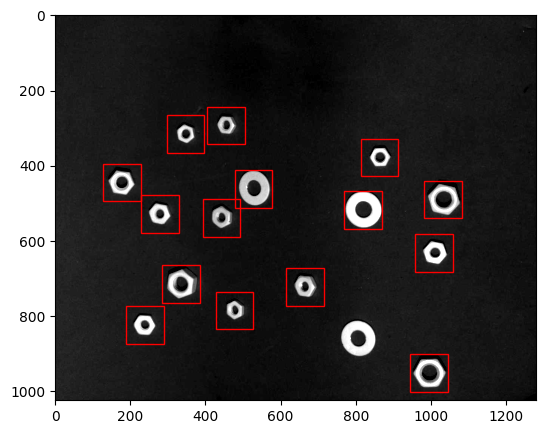

1/1 [==============================] - 0s 436ms/step


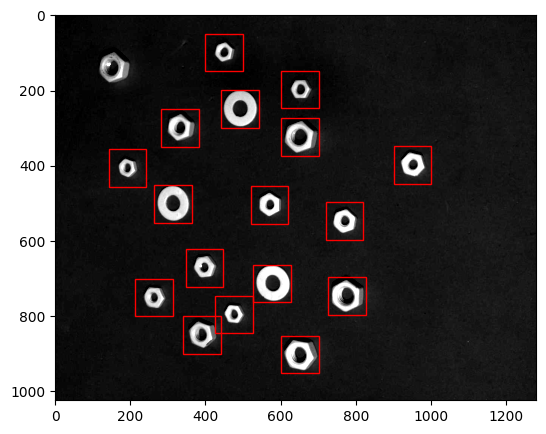

1/1 [==============================] - 1s 912ms/step


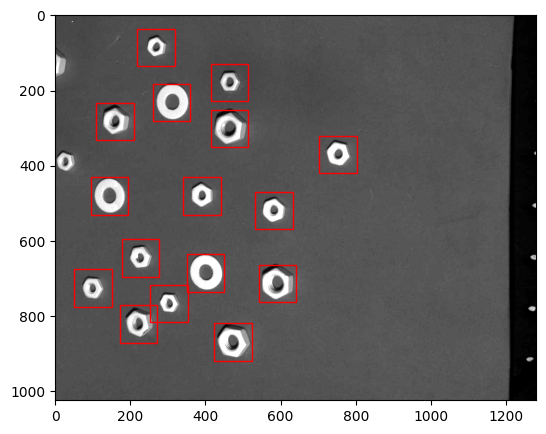

1/1 [==============================] - 0s 457ms/step


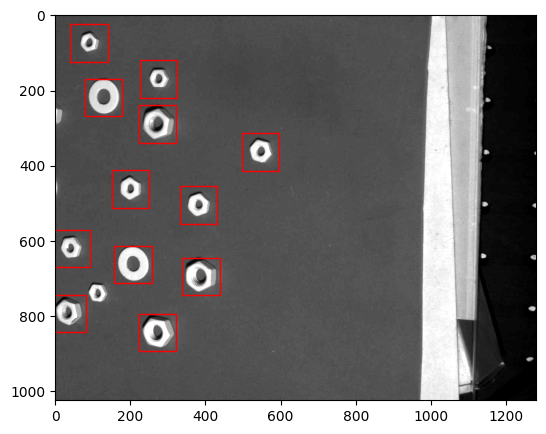

1/1 [==============================] - 0s 443ms/step


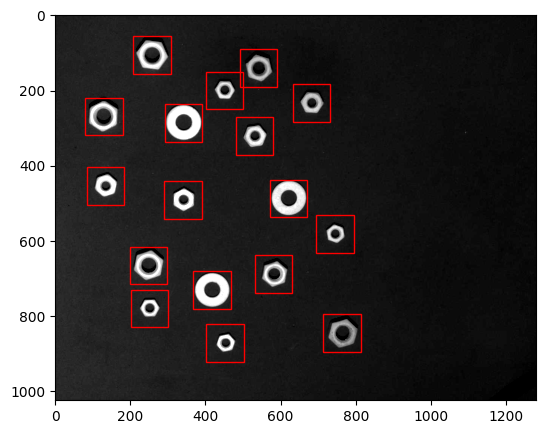

1/1 [==============================] - 0s 451ms/step


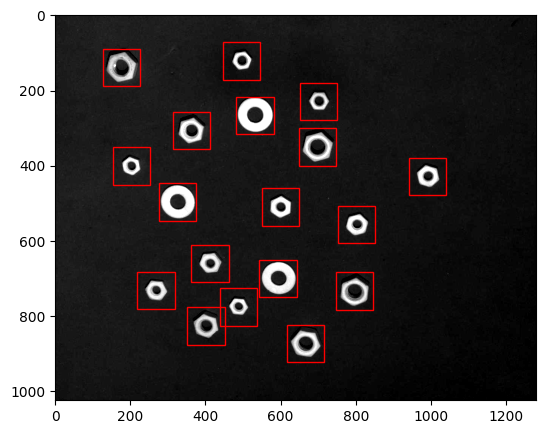

1/1 [==============================] - 1s 544ms/step


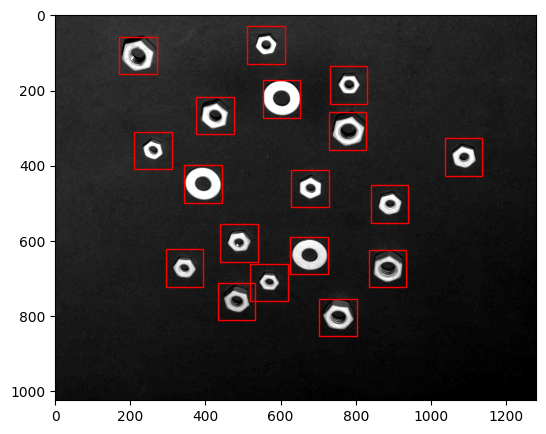

1/1 [==============================] - 1s 754ms/step


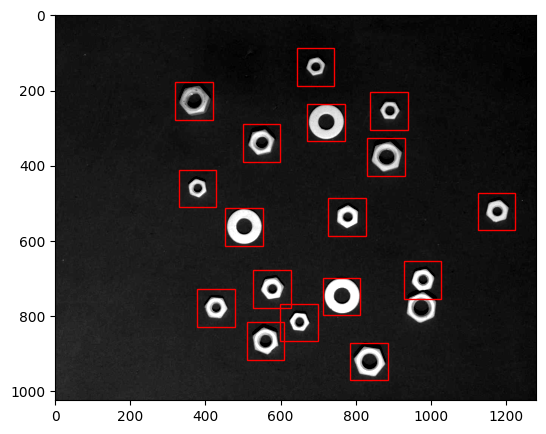

1/1 [==============================] - 0s 465ms/step


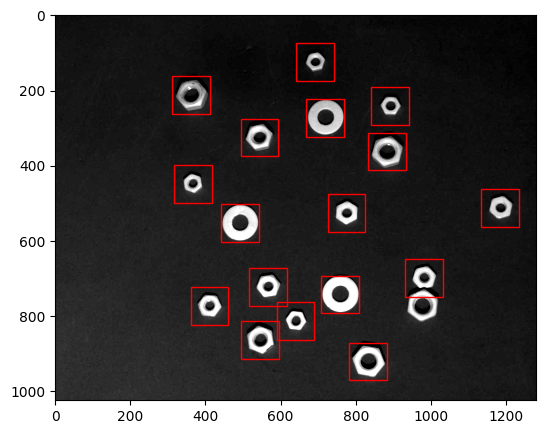

1/1 [==============================] - 0s 460ms/step


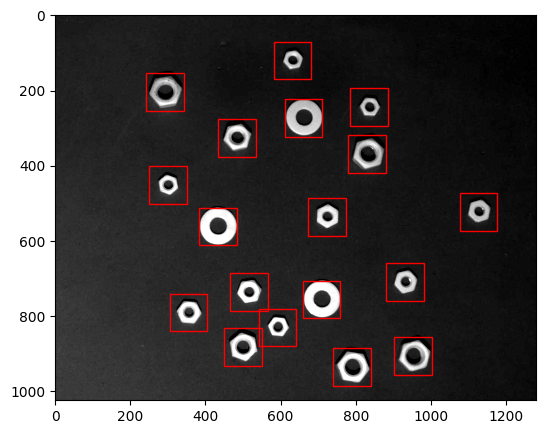

1/1 [==============================] - 1s 910ms/step


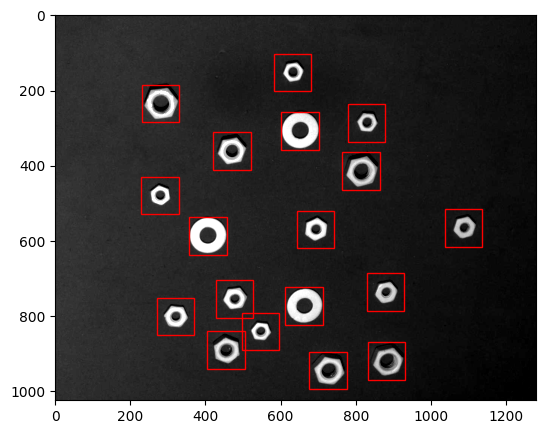

1/1 [==============================] - 1s 572ms/step


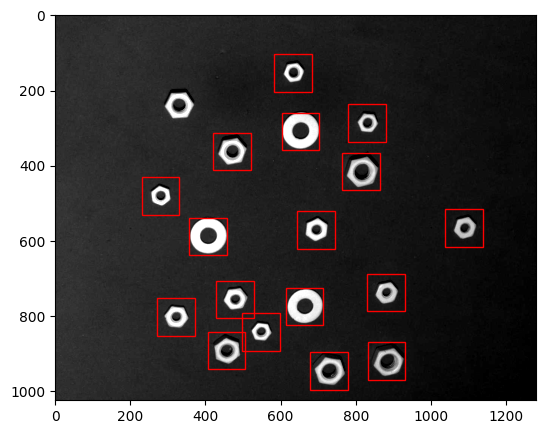

In [92]:
# @title
predictions_images_texture = []

for idx in range(len(images_texture)):
    detected_boxes_texture = test(images_texture[idx], crop_size=100, scales=[1, 1.25, 1.5], downsample=2, cutoff=0.9995, threshold=0.7, plot_previous=False, cmap='gray')
    # Invertir las coordenadas x e y en las predicciones
    inverted_boxes_texture = [invert_coordinates(bbox) for bbox in detected_boxes_texture]

    predictions_images_texture.append(inverted_boxes_texture)

### Carga de ground truth

In [93]:
folder_path = '/content/drive/MyDrive/Investigacion/Data/MATLAB/database/texture_vs_3D/texture/ground_truth'
file_type = '.pkl'
ground_truth_texture = load_files_from_folder(folder_path, file_type)

### Comparación de resultados

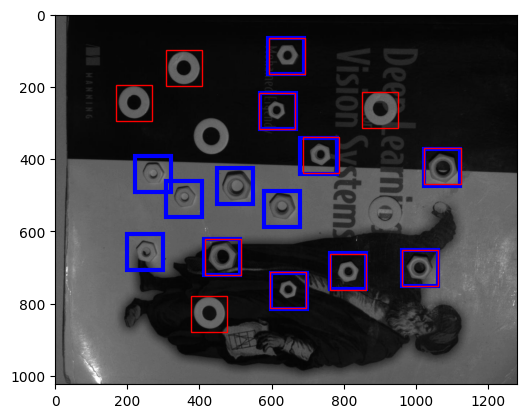

Precision: 0.667
Accuracy: 0.471
Recall: 0.615
F1 Score: 0.64


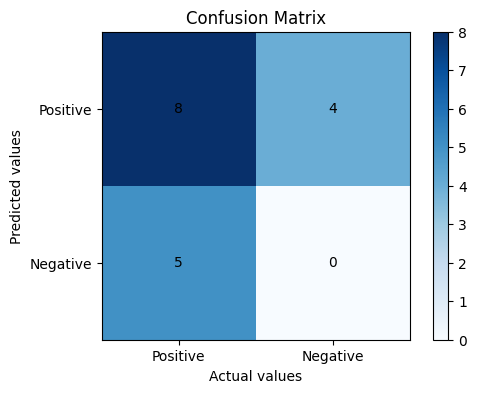

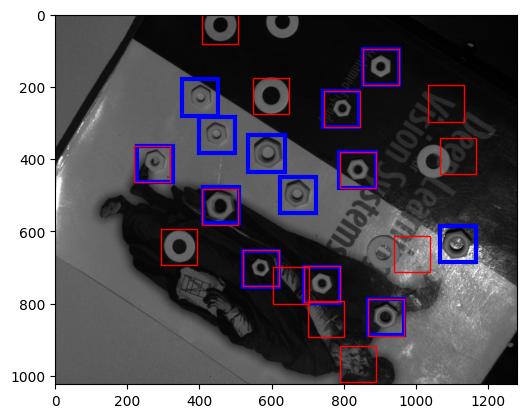

Precision: 0.471
Accuracy: 0.364
Recall: 0.615
F1 Score: 0.533


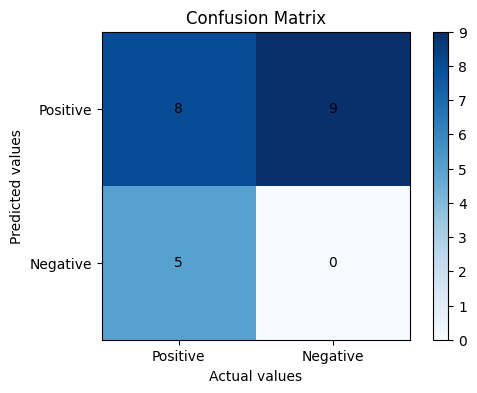

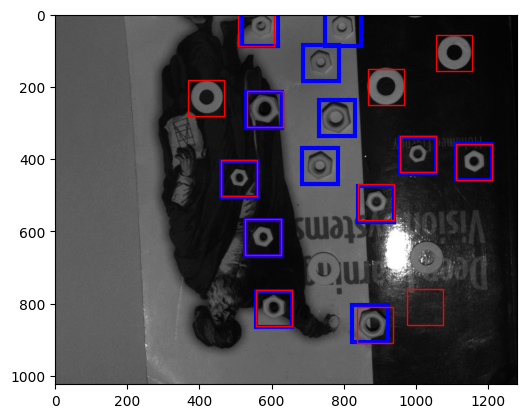

Precision: 0.692
Accuracy: 0.529
Recall: 0.692
F1 Score: 0.692


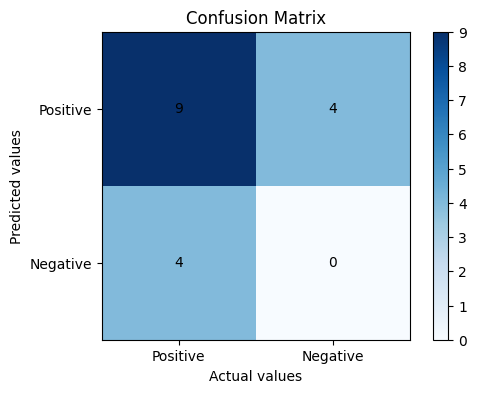

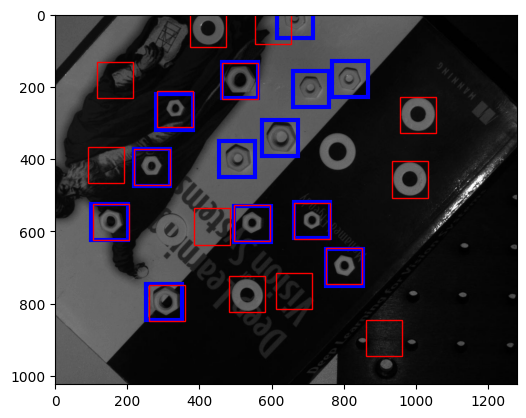

Precision: 0.444
Accuracy: 0.348
Recall: 0.615
F1 Score: 0.516


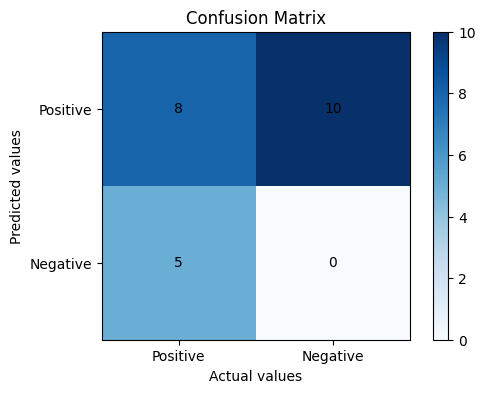

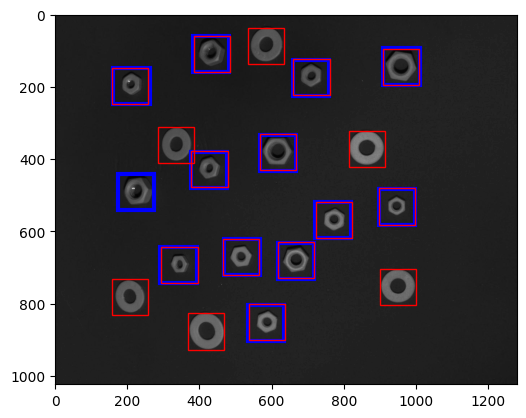

Precision: 0.667
Accuracy: 0.632
Recall: 0.923
F1 Score: 0.774


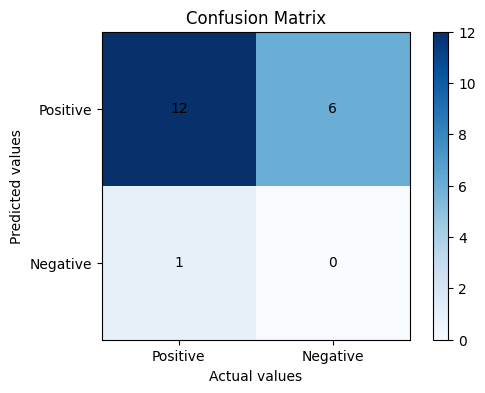

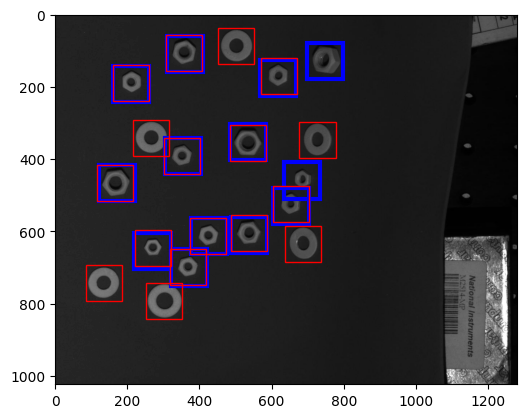

Precision: 0.647
Accuracy: 0.579
Recall: 0.846
F1 Score: 0.733


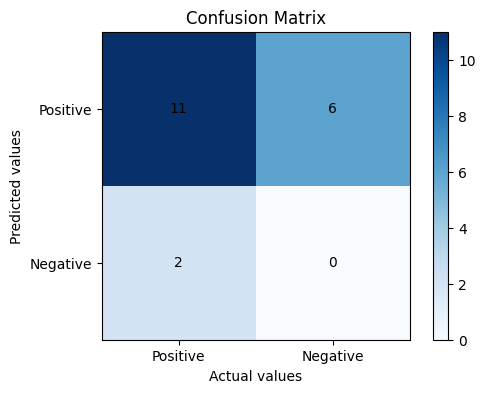

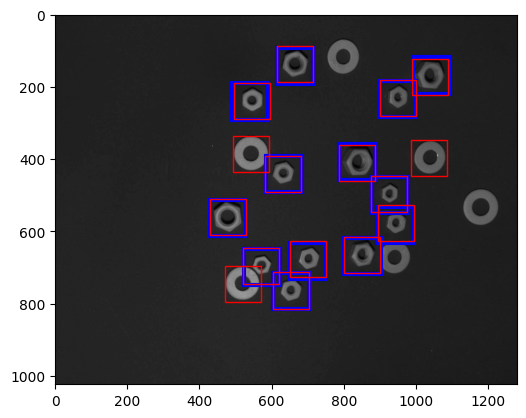

Precision: 0.812
Accuracy: 0.812
Recall: 1.0
F1 Score: 0.896


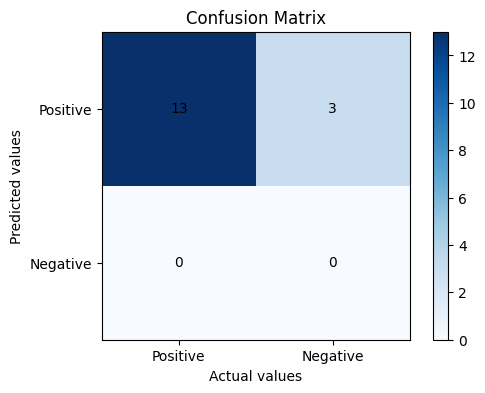

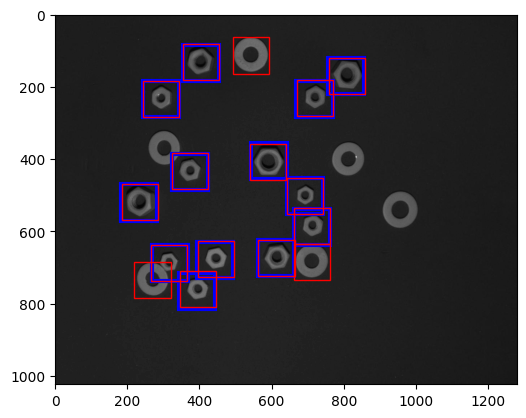

Precision: 0.812
Accuracy: 0.812
Recall: 1.0
F1 Score: 0.896


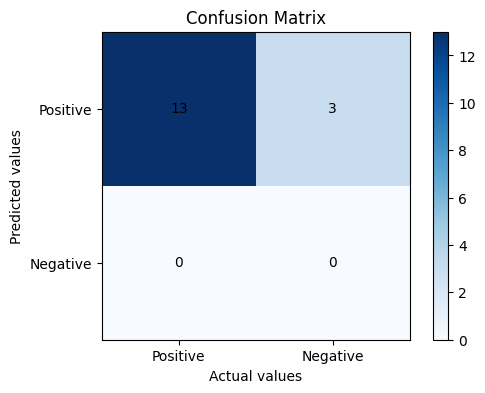

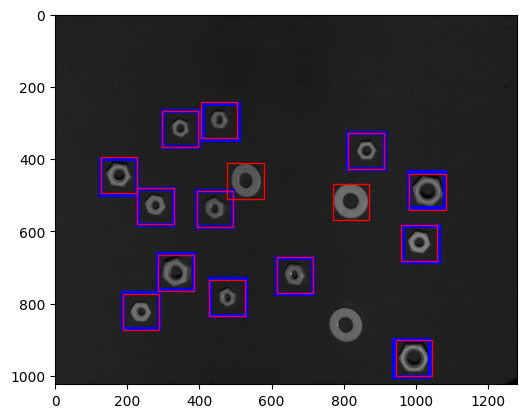

Precision: 0.867
Accuracy: 0.867
Recall: 1.0
F1 Score: 0.929


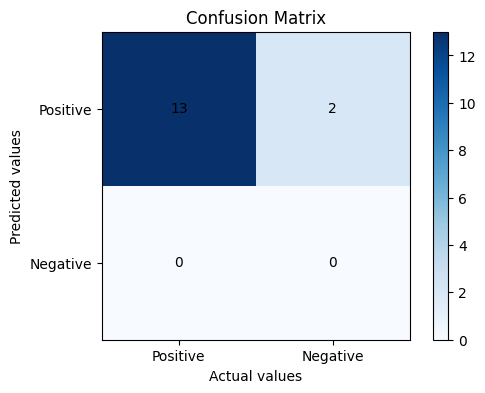

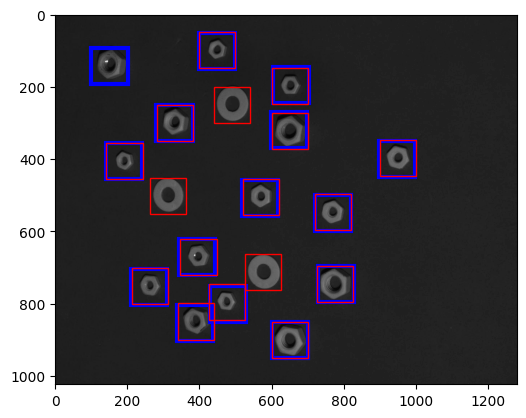

Precision: 0.824
Accuracy: 0.778
Recall: 0.933
F1 Score: 0.875


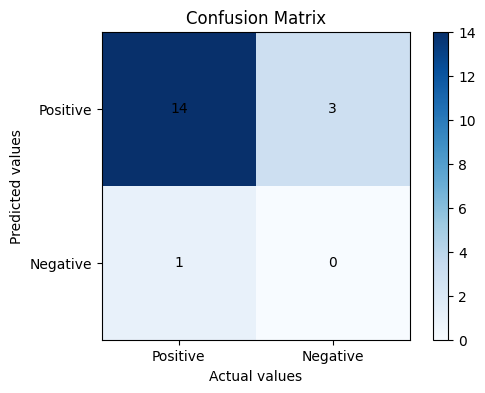

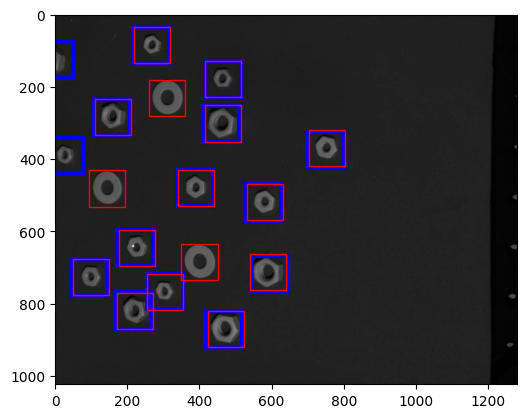

Precision: 0.812
Accuracy: 0.722
Recall: 0.867
F1 Score: 0.839


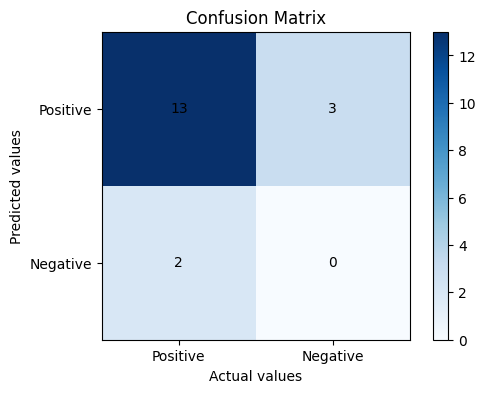

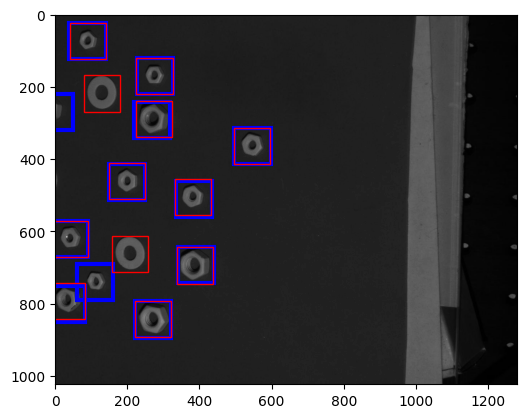

Precision: 0.833
Accuracy: 0.714
Recall: 0.833
F1 Score: 0.833


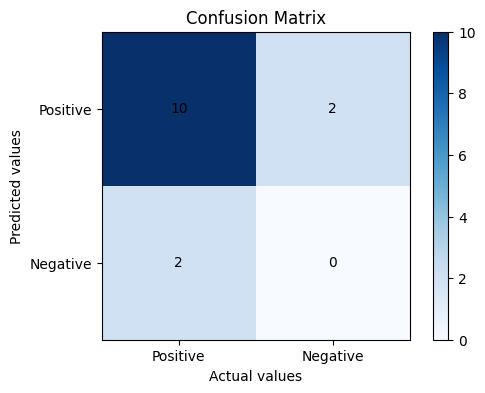

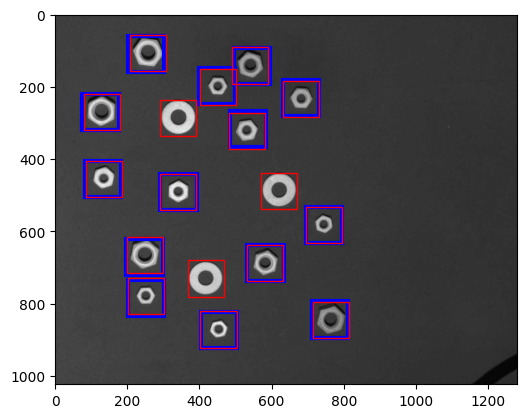

Precision: 0.824
Accuracy: 0.824
Recall: 1.0
F1 Score: 0.904


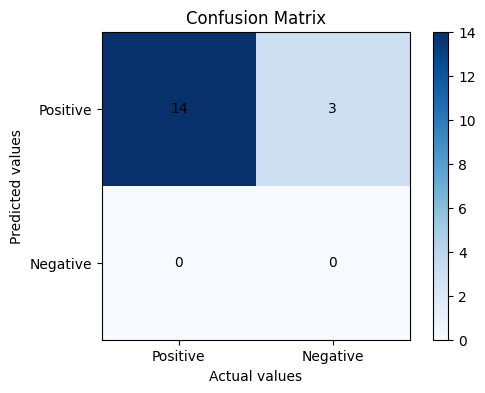

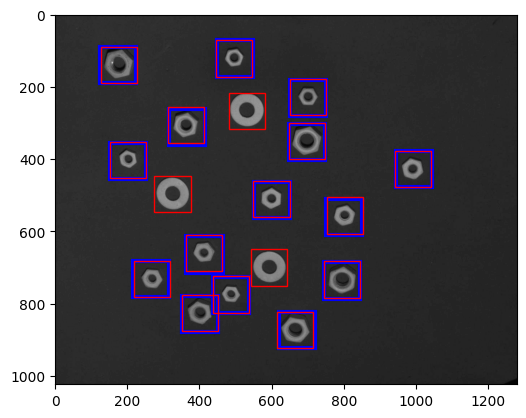

Precision: 0.833
Accuracy: 0.833
Recall: 1.0
F1 Score: 0.909


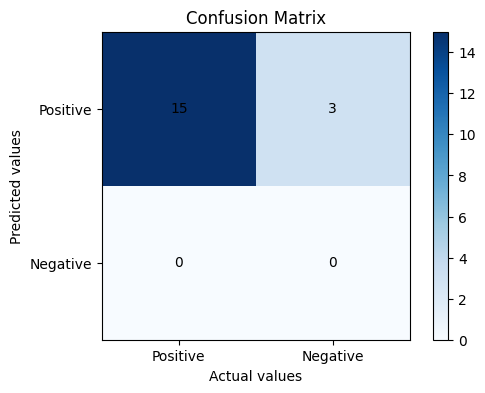

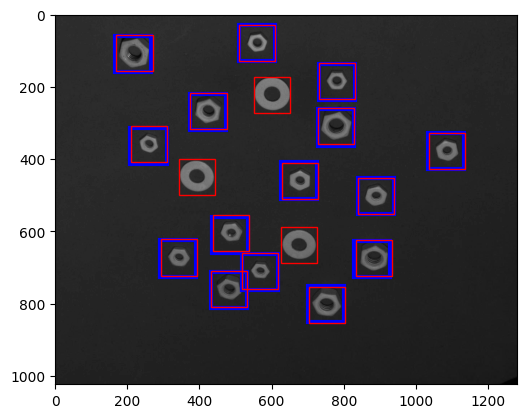

Precision: 0.833
Accuracy: 0.833
Recall: 1.0
F1 Score: 0.909


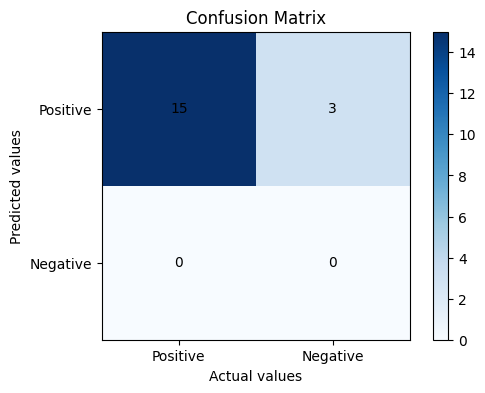

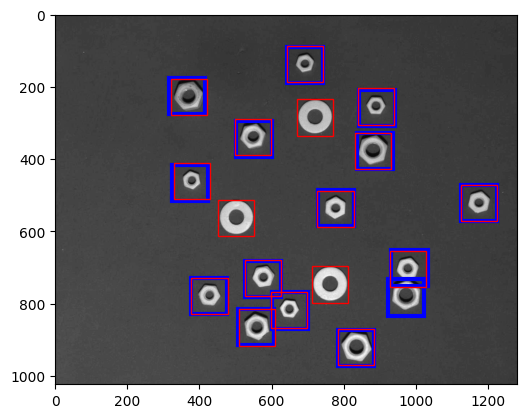

Precision: 0.824
Accuracy: 0.778
Recall: 0.933
F1 Score: 0.875


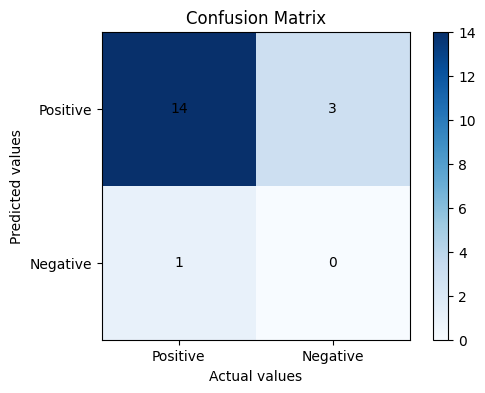

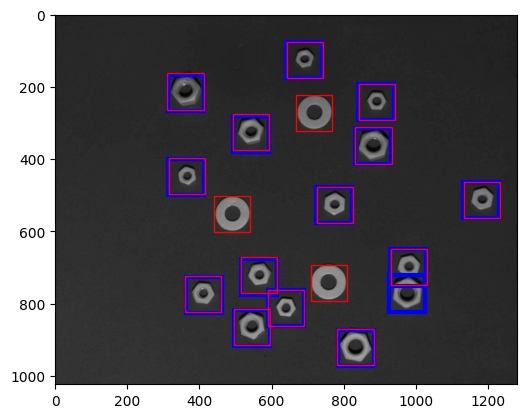

Precision: 0.824
Accuracy: 0.778
Recall: 0.933
F1 Score: 0.875


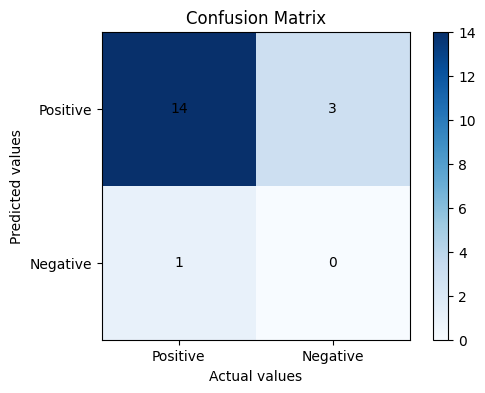

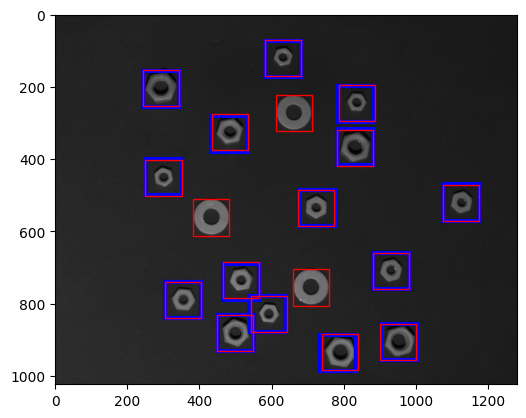

Precision: 0.833
Accuracy: 0.833
Recall: 1.0
F1 Score: 0.909


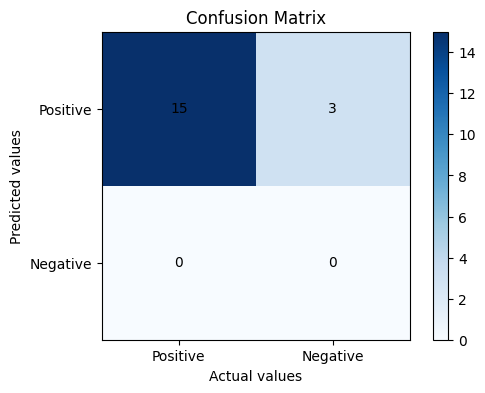

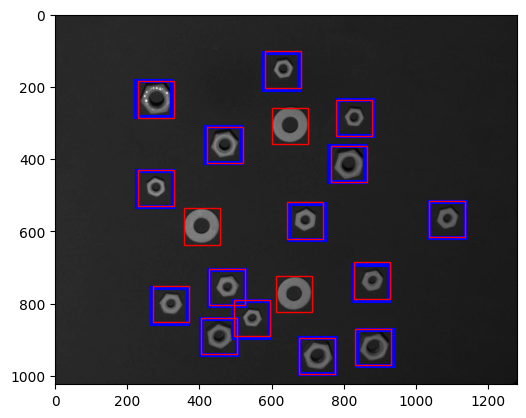

Precision: 0.833
Accuracy: 0.833
Recall: 1.0
F1 Score: 0.909


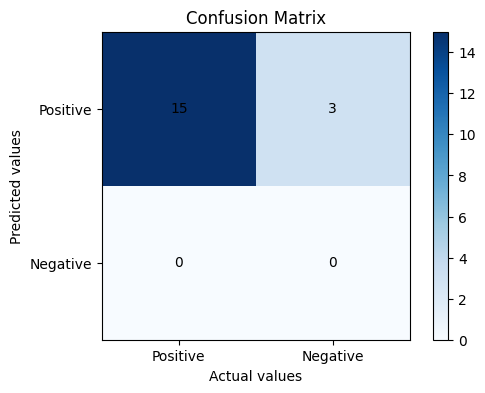

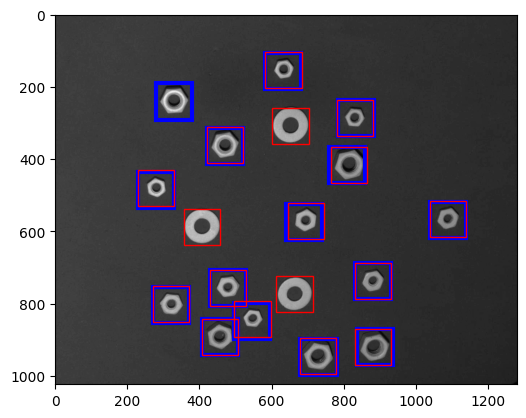

Precision: 0.824
Accuracy: 0.778
Recall: 0.933
F1 Score: 0.875


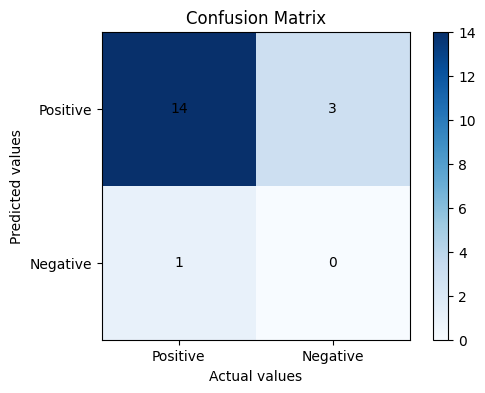

-----Average results-----

Average prom_precision: 0.759 +/- 0.122
Average prom_accuracy: 0.706 +/- 0.162
Average prom_recall: 0.887 +/- 0.141
Average prom_f1_score: 0.816 +/- 0.127


In [105]:
# Black - Ground truth
# Red - Predictions
evaluate_predictions(images_texture, ground_truth_texture, predictions_images_texture, cmap='gray', gt_color='blue')

# Imágenes para el paper
---

In [176]:
print(image1.shape)
print(image2.shape)

(961, 1217)
(961, 1217)


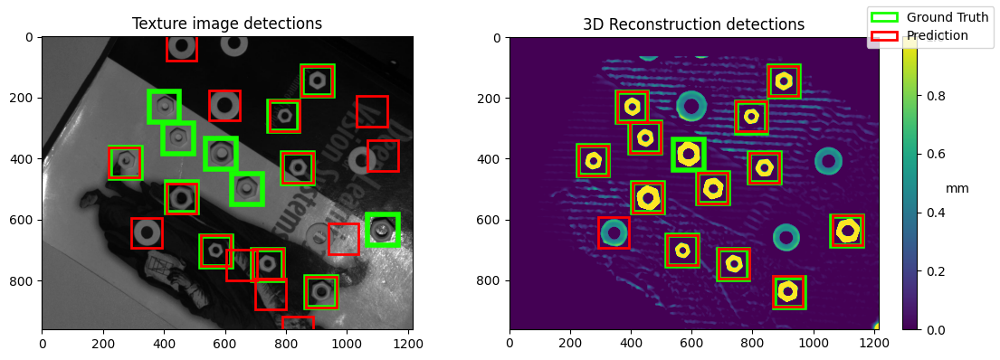

In [175]:
fig, ax = plt.subplots(1, 2, figsize=(11.5, 4))

# Buenas opciones: 1, 3
idx = 1

# Primer subplot: arm
image1 = images_texture[idx][:961, :1217]
im1 = ax[0].imshow(image1, cmap='gray')
ax[0].set_title('Texture image detections')
#ax[0].axis('off')

for bbox in ground_truth_texture[idx]:
    #rect = patches.Rectangle((bbox[1], bbox[0]), bbox[3] - bbox[1], bbox[2] - bbox[0], linewidth=1, edgecolor='r', facecolor='none')
    rect = patches.Rectangle((bbox[0], bbox[1]), bbox[3] - bbox[1], bbox[2] - bbox[0], linewidth=4, edgecolor='#16FF00', facecolor='none')
    ax[0].add_patch(rect)

for bbox in predictions_images_texture[idx]:
    #rect = patches.Rectangle((bbox[1], bbox[0]), bbox[3] - bbox[1], bbox[2] - bbox[0], linewidth=1, edgecolor='r', facecolor='none')
    rect = patches.Rectangle((bbox[0], bbox[1]), bbox[3] - bbox[1], bbox[2] - bbox[0], linewidth=2, edgecolor='r', facecolor='none')
    ax[0].add_patch(rect)


# Segundo subplot: preprocessed_image
image2 = images_3D[idx]
im2 = ax[1].imshow(image2, vmin=0.0, vmax=1.0)
ax[1].set_title('3D Reconstruction detections')
#ax[1].axis('off')

for bbox in ground_truth_3D[idx]:
    #rect = patches.Rectangle((bbox[1], bbox[0]), bbox[3] - bbox[1], bbox[2] - bbox[0], linewidth=1, edgecolor='r', facecolor='none')
    rect = patches.Rectangle((bbox[0], bbox[1]), bbox[3] - bbox[1], bbox[2] - bbox[0], linewidth=4, edgecolor='#16FF00', facecolor='none')
    ax[1].add_patch(rect)

for bbox in predictions_images_3D[idx]:
    #rect = patches.Rectangle((bbox[1], bbox[0]), bbox[3] - bbox[1], bbox[2] - bbox[0], linewidth=1, edgecolor='r', facecolor='none')
    rect = patches.Rectangle((bbox[0], bbox[1]), bbox[3] - bbox[1], bbox[2] - bbox[0], linewidth=2, edgecolor='r', facecolor='none')
    ax[1].add_patch(rect)


cbar = fig.colorbar(im2, ax=ax[1])
cbar.set_label('mm', rotation=0, labelpad=10)

legend_elements = [
    patches.Patch(facecolor='none', edgecolor='#16FF00', label='Ground Truth', linewidth=2),
    patches.Patch(facecolor='none', edgecolor='r', label='Prediction', linewidth=2)
]

# Agregar las leyendas personalizadas a la figura
fig.legend(handles=legend_elements)

plt.tight_layout()
plt.show()